In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
import json
import sqlite3
from scipy import stats
from geopy.distance import geodesic
from geopy.geocoders import OpenCage
import geocoder
from sgu import *
from smhi import *
from geocoder import *
from telecontrolnet import *
from plot import plot_groundwater_level


sgu = fetch_sgu_data()
smhi = fetch_smhi_data()
telecontrolnet = fetch_telecontrolnet_data()
geolocator = geolocator()


# Load local data

# smhi_precipitation_ = pd.read_excel('smhi_precipitation_.xlsx')


# smhi_air_pressure = pd.read_excel('smhi_air_pressure.xlsx')


# Göteborg_1_ = pd.read_excel('Göteborg_1_.xlsx')
# telecontrolnet_data_modify_ = pd.read_csv('telecontrolnet_modify.csv')
sgu_data = pd.read_csv("grundvattennivaer_lan_14.csv", encoding='latin-1',low_memory=False, delimiter=';')

list_of_ids = ['Lerum_10', 'Lerum_101', 'Lerum_102', 'Lerum_103', 'Lerum_11', 'Lerum_12', 'Lerum_13', 
               'Lerum_14','Göteborg_1','Göteborg_2', 'Göteborg_3', 'Göteborg_4']

sgu_data_ =sgu_data.loc[sgu_data['Stationens namn'].isin(list_of_ids)]
# sgu_standard = geolocator.sweref_to_lat_lon(sgu_data)
# sgu_data_ = sgu.convert_columns_to_standard(sgu_standard)
# sgu_data_['datetime'] = sgu_data_['datetime'].astype(str) + ' 12:00:00' 


SGU Länskoder:
Län: Blekinge län, 10
Län: Dalarnas län, 20
Län: Gotlands län, 09
Län: Gävleborgs län, 21
Län: Hallands län, 13
Län: Jämtlands län, 23
Län: Jönköpings län, 06
Län: Kalmar län, 08
Län: Kronobergs län, 07
Län: Norrbottens län, 25
Län: Skåne län, 12
Län: Stockholms län, 01
Län: Södermanlands län, 04
Län: Uppsala län, 03
Län: Värmlands län, 17
Län: Västerbottens län, 24
Län: Västernorrlands län, 22
Län: Västmanlands län, 19
Län: Västra Götalands län, 14
Län: Örebro län, 18
Län: Östergötlands län, 05


In [ ]:
# smhi.set_data_type('precipitation')
smhi.set_station()
smhi.print_station_ids()
# smhi_precipitation = smhi.fetch_data()

# # smhi.set_data_type('temperature')
# # smhi_temperature = smhi.fetch_data()

smhi.set_data_type('air_pressure')
smhi_air_pressure = smhi.fetch_data(include_historic_data=True)

In [ ]:
with pd.ExcelWriter('smhi_air_pressure.xlsx') as writer:
    smhi_air_pressure.to_excel(writer, index=False)

In [ ]:
df_value['datetime'] = pd.to_datetime(df_value['datetime'], unit='ms')

In [17]:
# sgu_stations = sgu.fetch_stations(lanskod=14)
# sgu_data = sgu.fetch_measurements(sgu_stations, is_active=True)
sgu_standard = geolocator.sweref_to_lat_lon(sgu_data)
sgu_data_modify = sgu.convert_columns_to_standard(sgu_standard)


In [68]:
sgu_data_modify['datetime'] = pd.to_datetime(sgu_data_modify['datetime'])

# Group by 'id'
sgu_grouped = sgu_data_modify.groupby('id')


def calculate_time_difference(group):
    min_date = group['datetime'].min()
    max_date = group['datetime'].max()
    time_difference_years = int((max_date - min_date).days / 365.25)  # 365.25 days per year for leap years
    
    group['years'] = time_difference_years
    return group

# Apply the function to each group
time_difference_by_id = sgu_grouped.apply(calculate_time_difference)

time_difference_by_id = time_difference_by_id.reset_index(drop=True)

time_difference_by_id_ = time_difference_by_id.loc[(time_difference_by_id['years'] >= 20)].dropna(subset='value')

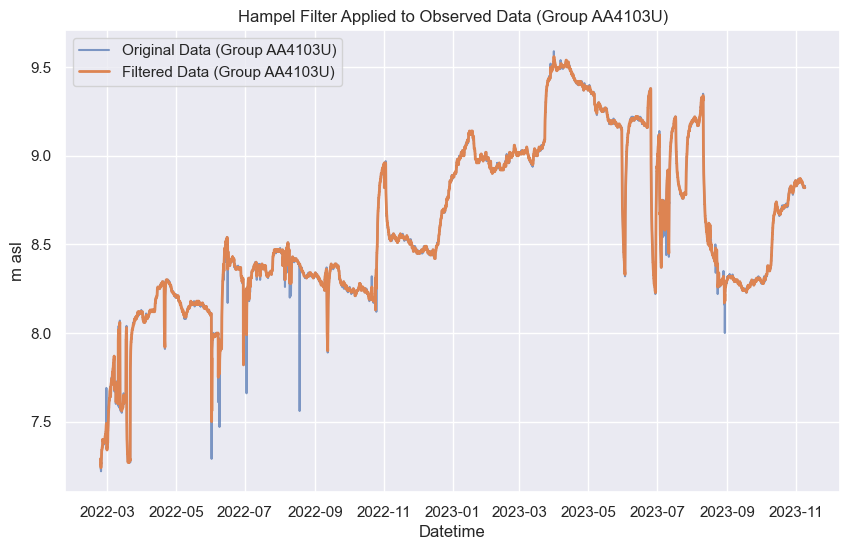

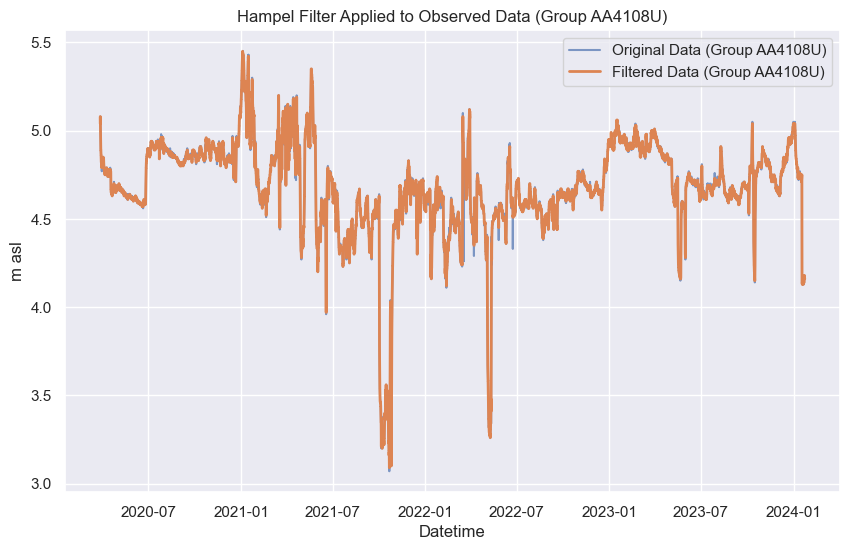

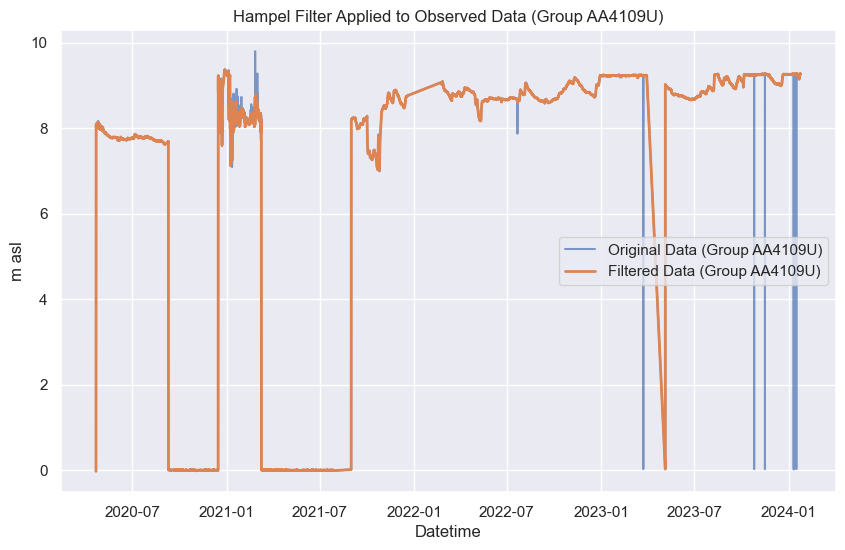

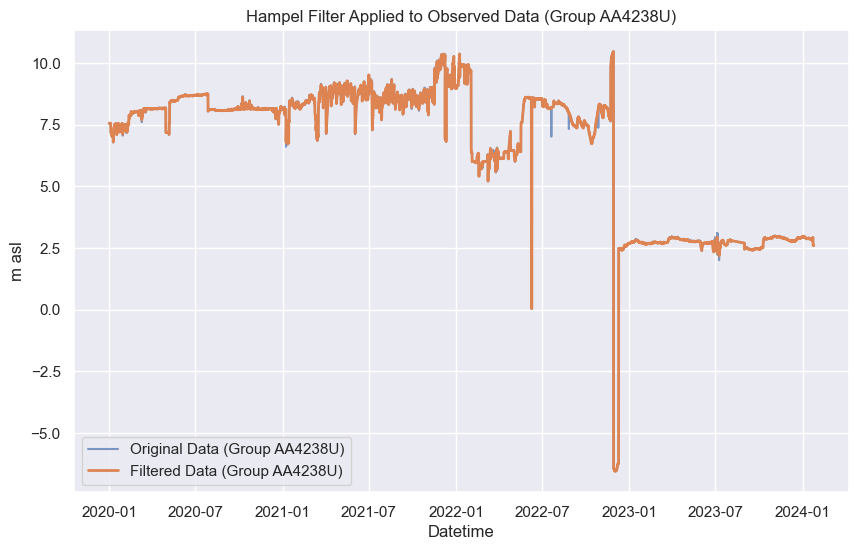

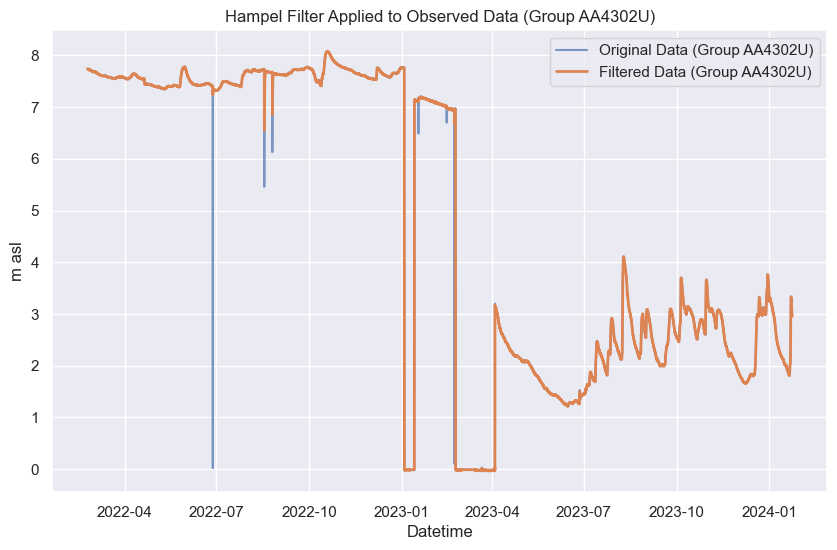

...

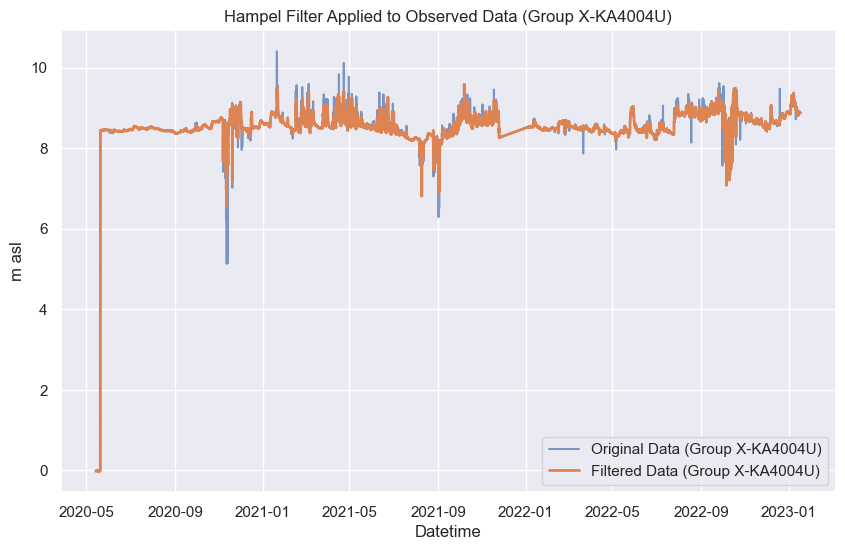

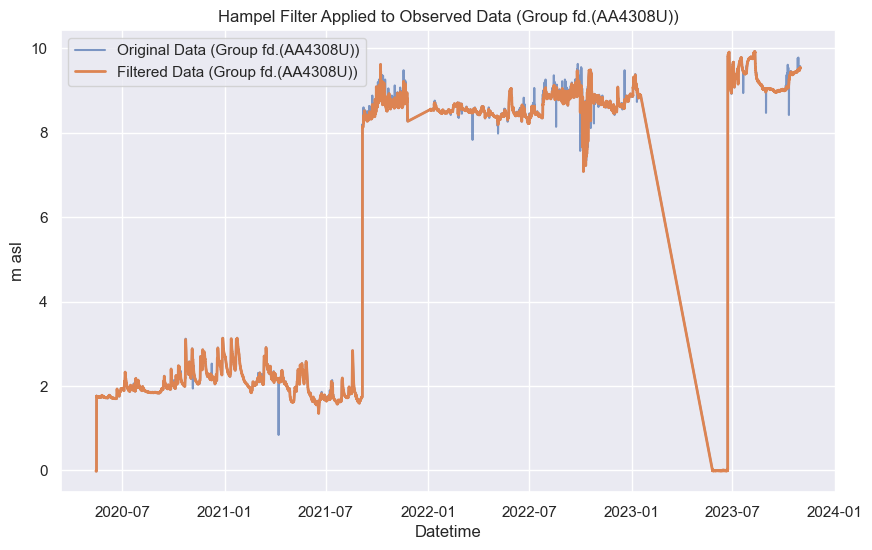

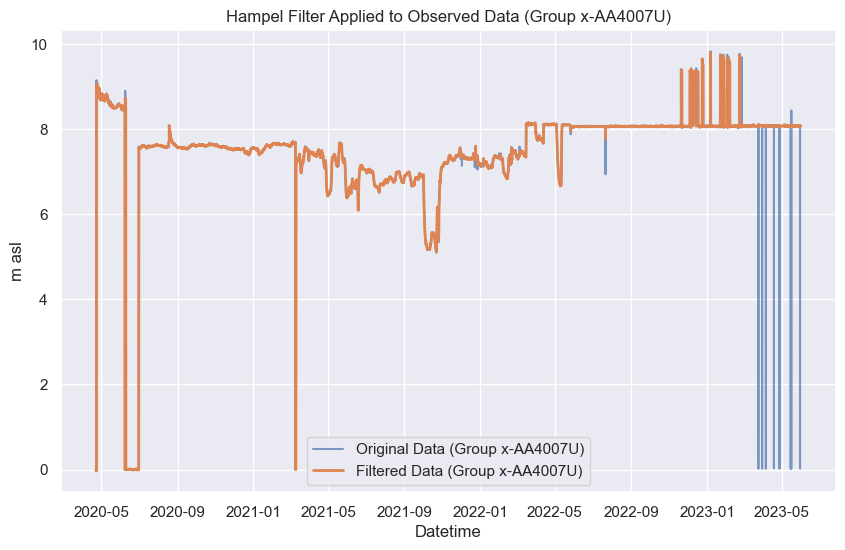

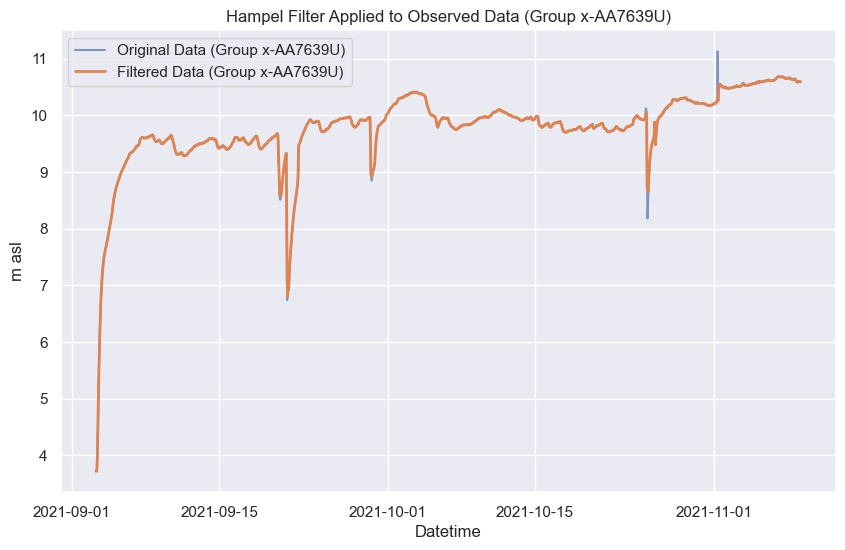

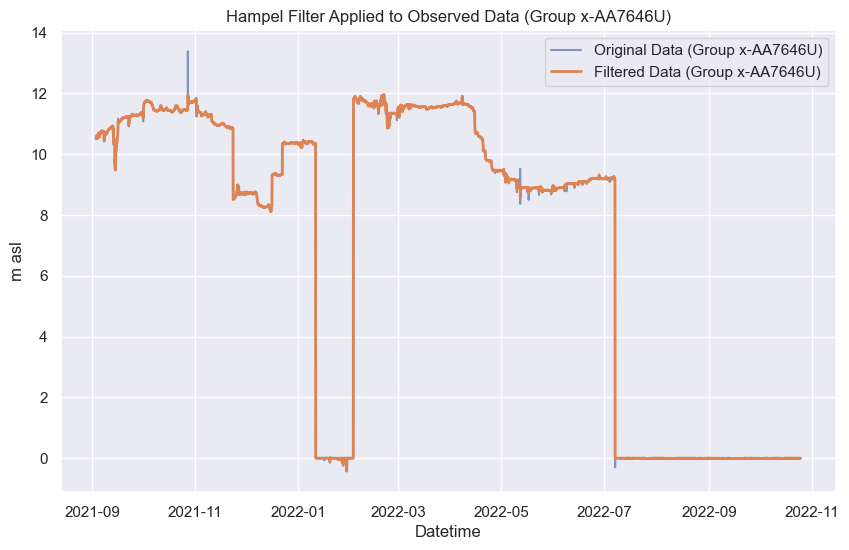

In [306]:


import pandas as pd
from scipy.signal import medfilt

def hampel_filter(data, window_size=5, n_sigma=2):
    """
    Apply Hampel filter to a pandas Series.

    Parameters:
    - data: pandas Series
    - window_size: int, size of the window for the median filter
    - n_sigma: int, number of standard deviations for outlier detection

    Returns:
    - filtered_data: pandas Series, Hampel-filtered data
    """
    # Apply a median filter to the data
    median_series = data.rolling(window=window_size, center=True).median()

    # Calculate the median absolute deviation (MAD)
    mad = (data - median_series).abs().rolling(window=window_size, center=True).median()

    # Calculate the z-score
    z_score = 0.6745 * (data - median_series) / mad

    # Identify outliers based on the z-score
    outliers = (z_score.abs() > n_sigma)

    # Replace outliers with the median value
    filtered_data = data.copy()
    filtered_data[outliers] = median_series[outliers]

    return filtered_data

# Assuming 'id' is the column based on which you want to group
grouped_data = obs_data_.groupby('id')

# Create individual plots for each group
for group, group_data in grouped_data:
    plt.figure(figsize=(10, 6))
    plt.plot(group_data['datetime'], group_data['m asl'], label=f'Original Data (Group {group})', alpha=0.7)
    
    # Apply Hampel filter to the current group
    filtered_data = hampel_filter(group_data['m asl'])
    
    plt.plot(group_data['datetime'], filtered_data, label=f'Filtered Data (Group {group})', linewidth=2)

    plt.xlabel('Datetime')
    plt.ylabel('m asl')
    plt.title(f'Hampel Filter Applied to Observed Data (Group {group})')
    plt.legend()
    plt.show()

In [307]:
obs_data

,station_id,id,datetime,m asl,°C,latitude,longitude,city,active,distance_Göteborg_1,...,distance_Lerum_3,distance_Lerum_5,distance_Lerum_6,distance_Lerum_8,distance_Lerum_9,distance_Gårdsjön_GV04,distance_Gårdsjön_GV05,distance_Gårdsjön_GV08,distance_Gårdsjön_GV09,m asl_filtered
0,38099902,AA4238U,2020-01-01 01:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16,7.55
1,38099902,AA4238U,2020-01-01 02:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16,7.55
2,38099902,AA4238U,2020-01-01 03:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16,7.55
3,38099902,AA4238U,2020-01-01 04:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16,7.55
4,38099902,AA4238U,2020-01-01 05:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16,7.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215644,43071109-20230614,KA4328H,2024-01-23 21:00:00,1.37,8.7,57.69723,11.994302,UNOSON,1,5.62,...,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76,1.37
1215645,43071109-20230614,KA4328H,2024-01-23 22:00:00,1.38,8.7,57.69723,11.994302,UNOSON,1,5.62,...,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76,1.38
1215646,43071109-20230614,KA4328H,2024-01-23 23:00:00,1.39,8.7,57.69723,11.994302,UNOSON,1,5.62,...,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76,1.39
1215647,43071109-20230614,KA4328H,2024-01-24 00:00:00,1.41,8.7,57.69723,11.994302,UNOSON,1,5.62,...,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76,1.41


In [297]:
obs_data_ = obs_data[['station_id', 'id', 'datetime', 'm asl', '°C', 'latitude', 'longitude', 'city', 'active']]

In [304]:
obs_data_.id.unique()

obs_data_ = obs_data_.loc[obs_data_.id.isin(['AA4238U', 'KA4274U', 'KA4233U', 'KK4255U', 'KA4262U',
       'KA611KBH', 'NCC2025G', 'X -NCC2010G', 'AA4108U',
       'AA7570U', 'X-AA4113U', 'fd.(AA4308U)', 'X-KA4004U',
       'X- KK7794KBH', 'x-AA4007U', 'AA4109U', 'AA7571U',
       'JU33101G25', 'KK4105U', 'KK7796KBH', 'KA4007U', 'X-AA7633U',
       'x-AA7639U', 'x-AA7646U', 'KA7586O', 'KK7707U', 'AA4103U',
       'AA4302U', 'KK5090G06',  'GW1914' ])]

obs_data_

,station_id,id,datetime,m asl,°C,latitude,longitude,city,active
0,38099902,AA4238U,2020-01-01 01:00:00,7.55,10.5,57.68449,12.00311,UNOSON,1
1,38099902,AA4238U,2020-01-01 02:00:00,7.55,10.5,57.68449,12.00311,UNOSON,1
2,38099902,AA4238U,2020-01-01 03:00:00,7.55,10.5,57.68449,12.00311,UNOSON,1
3,38099902,AA4238U,2020-01-01 04:00:00,7.55,10.5,57.68449,12.00311,UNOSON,1
4,38099902,AA4238U,2020-01-01 05:00:00,7.55,10.5,57.68449,12.00311,UNOSON,1
...,...,...,...,...,...,...,...,...,...
1206949,43071107-20230614,GW1914,2024-01-23 21:00:00,7.92,13.5,57.70658,11.96049,UNOSON,1
1206950,43071107-20230614,GW1914,2024-01-23 22:00:00,7.90,13.5,57.70658,11.96049,UNOSON,1
1206951,43071107-20230614,GW1914,2024-01-23 23:00:00,7.90,13.5,57.70658,11.96049,UNOSON,1
1206952,43071107-20230614,GW1914,2024-01-24 00:00:00,7.89,13.5,57.70658,11.96049,UNOSON,1


In [305]:
with pd.ExcelWriter('obs_data.xlsx') as writer:
    obs_data_.to_excel(writer)

In [308]:


# obs_data = merged_df.copy()
obs_data = pd.read_excel('obs_data.xlsx')
ref_data = time_difference_by_id_.copy()



# def add_overlap_column(obs_data, ref_data, correlation_threshold=0.7):
#     # Convert 'datetime' to datetime type
#     obs_data['datetime'] = pd.to_datetime(obs_data['datetime'])
#     ref_data['datetime'] = pd.to_datetime(ref_data['datetime'])

#     # Get unique IDs from observation and reference data
#     unique_obs_ids = obs_data['id'].unique()
#     unique_ref_ids = ref_data['id'].unique()

#     # Create a dictionary to store overlapping information
#     overlap_dict = {}

#     # Check for overlapping date range for each unique ID
#     for obs_id in unique_obs_ids:
#         overlap_dict[obs_id] = {}
#         obs_date_range = obs_data[obs_data['id'] == obs_id]['datetime']
        
#         # Drop any missing values before creating the IntervalIndex
#         obs_date_range = obs_date_range.dropna()
        
#         obs_start = obs_date_range.min()
#         obs_end = obs_date_range.max()

#         for ref_id in unique_ref_ids:
#             ref_date_range = ref_data[ref_data['id'] == ref_id]['datetime']
            
#             # Drop any missing values before creating the IntervalIndex
#             ref_date_range = ref_date_range.dropna()

#             ref_start = ref_date_range.min()
#             ref_end = ref_date_range.max()

#             overlap = not (obs_end < ref_start or obs_start > ref_end)
#             overlap_dict[obs_id][ref_id] = overlap
            
#     overlapping_dfs = []
#     for obs_id in unique_obs_ids:
        
#         for ref_id in unique_ref_ids:
#             if overlap_dict[obs_id][ref_id]:
#                 print(obs_id, ref_id)
#                 obs_df = obs_data[obs_data['id'] == obs_id]
#                 ref_df = ref_data[ref_data['id'] == ref_id]
#                 correlation = obs_df['m asl'].corr(ref_df['value'])
#                 if correlation > correlation_threshold:
#                     overlapping_dfs.append((obs_df, ref_df))

#     return overlapping_dfs


def create_overlapping_dataframes(obs_data, ref_data, correlation_threshold=0.7):
    # Convert 'datetime' to datetime type
    obs_data['datetime'] = pd.to_datetime(obs_data['datetime'])
    ref_data['datetime'] = pd.to_datetime(ref_data['datetime'])

    # Get unique IDs from observation and reference data
    unique_obs_ids = obs_data['id'].unique()
    np.random.shuffle(unique_obs_ids)
    unique_ref_ids = ref_data['id'].unique()

    # Create a list to store overlapping dataframes
    overlapping_dfs = []

    # Check for overlapping date range for each unique ID
    for obs_id in unique_obs_ids:
        obs_date_range = obs_data[obs_data['id'] == obs_id]['datetime']

        # Drop any missing values before creating the IntervalIndex
        obs_date_range = obs_date_range.dropna()

        obs_start = obs_date_range.min()
        obs_end = obs_date_range.max()

        for ref_id in unique_ref_ids:
            ref_date_range = ref_data[ref_data['id'] == ref_id]['datetime']

            # Drop any missing values before creating the IntervalIndex
            ref_date_range = ref_date_range.dropna()

            ref_start = ref_date_range.min()
            ref_end = ref_date_range.max()

            overlap = not (obs_end < ref_start or obs_start > ref_end)

            if overlap:
                obs_df = obs_data[obs_data['id'] == obs_id]
                ref_df = ref_data[ref_data['id'] == ref_id]
                
                aligned_df = pd.merge_asof(
                    obs_df.sort_values('datetime'),
                    ref_df.sort_values('datetime'),
                    on='datetime'
                )
                
                aligned_df = aligned_df.replace([np.inf, -np.inf], np.nan).dropna()
                corr, _ = pearsonr(aligned_df['value'], aligned_df['m asl'])
                

                if corr > correlation_threshold:
#                     print(f"For obs {obs_id} and ref {ref_id} corr: {corr}")
                    
                    obs_df = obs_df.copy()
                    ref_df = ref_df.copy()
                    obs_df['coorelation'] = corr
                    ref_df['coorelation'] = corr
                    filtered_obs, filtered_ref = filter_data(obs_df, ref_df)
                
                    if filtered_obs is not None and filtered_ref is not None:
                        
                        return_time, standard_deviation = process_observed_values(filtered_ref, filtered_obs)
                        filtered_obs.loc[:, 'return_time'] = return_time                     
                        filtered_obs.loc[:, 'standard_deviation'] = standard_deviation
                        
                        
                        overlapping_dfs.append((filtered_obs, filtered_ref))



    return overlapping_dfs

def process_observed_values(referens_data, observation_data, hydrological_start_month=10):
        """
        Processes observed values of the reference well.

        Parameters:
        - referens_data: DataFrame with columns 'datetime', 'value'.
        - observation_data: DataFrame with columns 'datetime', 'value'.
        - hydrological_start_month: Start month of the hydrological year (October).

        Returns:
        - plotting_positions: DataFrame with columns 'rank', 'max_value', 'probability'.
        """

        # Convert 'datetime' to datetime format
        referens_data['datetime'] = pd.to_datetime(referens_data['datetime'])
        observation_data['datetime'] = pd.to_datetime(observation_data['datetime'])

        # Extract hydrological year from the observation date
        referens_data['hydrological_year'] = np.where(referens_data['datetime'].dt.month >= hydrological_start_month,
                                                    referens_data['datetime'].dt.year,
                                                    referens_data['datetime'].dt.year - 1)


        observation_data['hydrological_year'] = np.where(observation_data['datetime'].dt.month >= hydrological_start_month,
                                                    observation_data['datetime'].dt.year,
                                                    observation_data['datetime'].dt.year - 1)
        
        # Group data by hydrological year and find the maximum value in each year
        max_values_by_year = referens_data.groupby('hydrological_year')['value'].max().reset_index()


        # Sort values in descending order to rank them
        max_values_by_year = max_values_by_year.sort_values(by='value', ascending=False).reset_index(drop=True)

        # Assign ranks to sorted values
        max_values_by_year['rank'] = max_values_by_year.index + 1

        # Calculate plotting positions using Weibull formula
        max_values_by_year['probability'] = (len(max_values_by_year) + 1 - max_values_by_year['rank']) / (len(max_values_by_year) + 1)
        
        # Calculate return period using the provided formula (equation 7)
        max_values_by_year['return_period'] = 1 / max_values_by_year['probability']

        # Create a DataFrame with the required columns
        plotting_positions = max_values_by_year[['rank', 'value', 'probability']].rename(columns={'value': 'max_value'})

        standard_deviation = Smax = plotting_positions['max_value'].std()
        
        frequencyfactors = 2.3264
        
        Y_RmaxT = plotting_positions['max_value'].mean() + frequencyfactors * Smax

        S_tr = Y_RmaxT - plotting_positions['max_value'].max()

        return_time = Y0_max_T = observation_data['m asl'].max() + S_tr * ((observation_data['m asl'].max() - observation_data['m asl'].min()) / (plotting_positions['max_value'].max() - plotting_positions['max_value'].min()))


        print('Y_RmaxT: ', Y_RmaxT
              , '\nS_tr: ', S_tr
              , '\nY0_max_T: ', Y0_max_T
              )
        
        
        return return_time, standard_deviation
    
    
def filter_data(observations_data, reference_data):
        """
        Filters data based on specified criteria for reference and observation datasets.

        Parameters:
        - referens_data: DataFrame with columns 'observation_date', 'variations', and 'reference_lifetime'.
        - observations_data: DataFrame with columns 'observation_date', 'variations'.

        Returns:
        - filtered_referens: DataFrame after applying filters and interpolation for reference data.
        - filtered_observations: DataFrame after applying filters and interpolation for observation data.
        """

       # Convert 'datetime' to datetime format for both datasets
        reference_data['datetime'] = pd.to_datetime(reference_data['datetime'])
        observations_data.loc[:,'datetime'] = pd.to_datetime(observations_data['datetime'])

        # Set the date frequency to 'MS' (Month Start) to check for monthly observations for both datasets
        reference_data.set_index('datetime', inplace=True)
        reference_data_ = reference_data.resample('MS').max()

        observations_data.set_index('datetime', inplace=True)
        observations_data_ = observations_data.resample('MS').max()

        # Set the reference date for interpolation for both datasets
        referens_reference_date = reference_data_.index[0]
        observations_reference_date = observations_data_.index[0]

        # Calculate the lifetime variation range for reference and observation datasets
        lifetime_variation_range_reference = reference_data['value'].max() - reference_data['value'].min()
        lifetime_variation_range_observation = observations_data['m asl'].max() - observations_data['m asl'].min()

        
        # Set the maximum allowed variation as 30% of the variation range for the entire lifetime
        max_variation_observation = 0.3 * lifetime_variation_range_reference
        print(f'Ref {reference_data.id.iloc[0]}: {lifetime_variation_range_reference}\nObs {observations_data.id.iloc[0]}: {lifetime_variation_range_observation}\nMax variation observation: {max_variation_observation}')

        # Check if the observation well's variation is 30% higher or more than the reference well
#         if lifetime_variation_range_observation >= 1.3 * lifetime_variation_range_reference:
        if lifetime_variation_range_observation <= max_variation_observation:
            print(f"Reference well {reference_data.id.iloc[0]} has too high variation compared to the observation well {observations_data.id.iloc[0]}.")
            return None, None
        else:
            # Filter data based on variations for reference_data
            filtered_reference = reference_data[abs(reference_data['value'] - reference_data['value'].mean()) <= max_variation_observation].copy()

            # Linear interpolation for missing data for reference_data
#             filtered_reference['value'] = filtered_reference['value'].astype(float)
#             filtered_observations['m asl'] = filtered_observations['m asl'].astype(float)


            filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
            filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')

            # Reset index for final result for both datasets
            filtered_reference.reset_index(inplace=True)
            filtered_observations.reset_index(inplace=True)

            return filtered_observations, filtered_reference
            

# Assuming 'obs_data' and 'ref_data' are your DataFrames
test = create_overlapping_dataframes(obs_data, ref_data)

# filtered_observations, filtered_reference

Ref Kungälv_10: 1.8000000000000007
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.5400000000000001
Y_RmaxT:  14.885126905678705 
S_tr:  0.005126905678704219 
Y0_max_T:  4.149126385442743


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_11: 2.7600000000000016
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.8280000000000004
Y_RmaxT:  19.2769022777086 
S_tr:  0.11690227770860062 
Y0_max_T:  4.6236615232650635


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_1: 0.8599999999999994
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.25799999999999984
Y_RmaxT:  101.85832641093464 
S_tr:  0.04832641093463508 
Y0_max_T:  5.04431061140291


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_6: 0.8799999999999955
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.2639999999999986
Y_RmaxT:  95.41132469718507 
S_tr:  0.041324697185061154 
Y0_max_T:  4.462475358343165


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_8: 1.1799999999999926
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.35399999999999776
Y_RmaxT:  100.92220033207529 
S_tr:  0.08220033207528843 
Y0_max_T:  4.596491761261903


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_9: 1.1199999999999903
Obs AA4302U: 2.9000000000000004
Max variation observation: 0.3359999999999971
Y_RmaxT:  109.32264571295808 
S_tr:  0.10264571295807912 
Y0_max_T:  5.070234088962669


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungsbacka_2: 1.9399999999999977
Obs KA4233U: 1.0
Max variation observation: 0.5819999999999993
Y_RmaxT:  52.65512869389017 
S_tr:  0.06512869389016629 
Y0_max_T:  1.1900925609360187


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_11: 2.7600000000000016
Obs KA4233U: 1.0
Max variation observation: 0.8280000000000004
Y_RmaxT:  19.2769022777086 
S_tr:  0.11690227770860062 
Y0_max_T:  1.1571246631948493


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_15: 1.2100000000000009
Obs KA4233U: 1.0
Max variation observation: 0.36300000000000027
Y_RmaxT:  27.103157188944618 
S_tr:  0.18315718894461597 
Y0_max_T:  1.2707256967374845


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lefsebäcken_1: 2.2099999999999937
Obs KA4233U: 1.0
Max variation observation: 0.6629999999999981
Y_RmaxT:  109.82454181623041 
S_tr:  0.08454181623041279 
Y0_max_T:  1.2084913952173377


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lefsebäcken_3: 2.4200000000000017
Obs KA4233U: 1.0
Max variation observation: 0.7260000000000005
Y_RmaxT:  111.62610879297054 
S_tr:  0.40610879297054225 
Y0_max_T:  1.2600750296348562


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lefsebäcken_4: 3.240000000000009
Obs KA4233U: 1.0
Max variation observation: 0.9720000000000026
Y_RmaxT:  126.02085419575157 
S_tr:  0.3808541957515672 
Y0_max_T:  1.2080564046416566


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_1: 0.8599999999999994
Obs KA4233U: 1.0
Max variation observation: 0.25799999999999984
Y_RmaxT:  101.85832641093464 
S_tr:  0.04832641093463508 
Y0_max_T:  1.3021760728975549


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_10: 1.5200000000000102
Obs KA4233U: 1.0
Max variation observation: 0.45600000000000307
Y_RmaxT:  127.71235685076877 
S_tr:  0.13235685076877246 
Y0_max_T:  1.2808110244744844


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_8: 1.1799999999999926
Obs KA4233U: 1.0
Max variation observation: 0.35399999999999776
Y_RmaxT:  100.92220033207529 
S_tr:  0.08220033207528843 
Y0_max_T:  1.1477557797454834


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungsbacka_11: 1.990000000000002
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.5970000000000005
Y_RmaxT:  42.96515946456504 
S_tr:  0.08515946456503798 
Y0_max_T:  2.5216563779500536


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungsbacka_14: 2.1000000000000014
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.6300000000000004
Y_RmaxT:  43.08798757693106 
S_tr:  0.09798757693106097 
Y0_max_T:  2.8246128333679246


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungsbacka_2: 1.9399999999999977
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.5819999999999993
Y_RmaxT:  52.65512869389017 
S_tr:  0.06512869389016629 
Y0_max_T:  2.6731203292168244


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_10: 1.8000000000000007
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.5400000000000001
Y_RmaxT:  14.885126905678705 
S_tr:  0.005126905678704219 
Y0_max_T:  2.417539414163988


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_11: 2.7600000000000016
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.8280000000000004
Y_RmaxT:  19.2769022777086 
S_tr:  0.11690227770860062 
Y0_max_T:  2.630262062153304
Ref Kungälv_15: 1.2100000000000009
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.36300000000000027


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolat

Y_RmaxT:  27.103157188944618 
S_tr:  0.18315718894461597 
Y0_max_T:  2.7779434057587298
Ref Lefsebäcken_3: 2.4200000000000017
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.7260000000000005
Y_RmaxT:  111.62610879297054 
S_tr:  0.40610879297054225 
Y0_max_T:  2.764097538525313


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_1: 0.8599999999999994
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.25799999999999984
Y_RmaxT:  101.85832641093464 
S_tr:  0.04832641093463508 
Y0_max_T:  2.8188288947668214


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_10: 1.5200000000000102
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.45600000000000307
Y_RmaxT:  127.71235685076877 
S_tr:  0.13235685076877246 
Y0_max_T:  2.7910543318168295


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_14: 1.8100000000000023
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.5430000000000007
Y_RmaxT:  127.87101790907481 
S_tr:  0.07101790907481131 
Y0_max_T:  2.6308082044931416


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_8: 1.1799999999999926
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.35399999999999776
Y_RmaxT:  100.92220033207529 
S_tr:  0.08220033207528843 
Y0_max_T:  2.6180825136691284


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_9: 1.1199999999999903
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.3359999999999971
Y_RmaxT:  109.32264571295808 
S_tr:  0.10264571295807912 
Y0_max_T:  2.830449764017748


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lysekil_3: 2.269999999999996
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.6809999999999988
Y_RmaxT:  37.50936928585934 
S_tr:  0.10936928585934425 
Y0_max_T:  2.784270463830131


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Tiveden_28: 1.75
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.525
Y_RmaxT:  123.92542809741771 
S_tr:  0.08542809741770441 
Y0_max_T:  2.6221130532860313


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Ödskölt_10: 1.4299999999999784
Obs KK5090G06: 1.2999999999999998
Max variation observation: 0.4289999999999935
Y_RmaxT:  159.2685242928676 
S_tr:  0.07852429286759843 
Y0_max_T:  2.719004939774625


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Herrljunga_8: 3.6599999999999966
Obs GW1914: 3.26
Max variation observation: 1.097999999999999
Y_RmaxT:  147.31906226449902 
S_tr:  0.43906226449902874 
Y0_max_T:  9.010277031768789


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungsbacka_11: 1.990000000000002
Obs GW1914: 3.26
Max variation observation: 0.5970000000000005
Y_RmaxT:  42.96515946456504 
S_tr:  0.08515946456503798 
Y0_max_T:  8.585076763167057
Ref Kungsbacka_14: 2.1000000000000014
Obs GW1914: 3.26
Max variation observation: 0.6300000000000004


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolat

Y_RmaxT:  43.08798757693106 
S_tr:  0.09798757693106097 
Y0_max_T:  9.34479833598418
Ref Kungälv_3: 2.8500000000000014
Obs GW1914: 3.26
Max variation observation: 0.8550000000000004
Y_RmaxT:  13.863984033263806 
S_tr:  -0.016015966736194542 
Y0_max_T:  8.227787948440005


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Kungälv_7: 1.33
Obs GW1914: 3.26
Max variation observation: 0.399
Y_RmaxT:  6.307970239444963 
S_tr:  0.1879702394449625 
Y0_max_T:  9.672688592251312


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lerum_14: 1.8100000000000023
Obs GW1914: 3.26
Max variation observation: 0.5430000000000007
Y_RmaxT:  127.87101790907481 
S_tr:  0.07101790907481131 
Y0_max_T:  8.858795958959725


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lysekil_2: 3.1400000000000006
Obs GW1914: 3.26
Max variation observation: 0.9420000000000002
Y_RmaxT:  36.4050020791216 
S_tr:  -0.07499792087839552 
Y0_max_T:  7.920451144024162


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Lysekil_3: 2.269999999999996
Obs GW1914: 3.26
Max variation observation: 0.6809999999999988
Y_RmaxT:  37.50936928585934 
S_tr:  0.10936928585934425 
Y0_max_T:  9.243632086220174


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Tiveden_18: 2.3500000000000085
Obs GW1914: 3.26
Max variation observation: 0.7050000000000025
Y_RmaxT:  121.90702820021247 
S_tr:  0.22702820021245884 
Y0_max_T:  9.534427004563748


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Tiveden_26: 2.0799999999999983
Obs GW1914: 3.26
Max variation observation: 0.6239999999999994
Y_RmaxT:  125.59835449909104 
S_tr:  0.11835449909104057 
Y0_max_T:  9.177292248922758


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Ödskölt_10: 1.4299999999999784
Obs GW1914: 3.26
Max variation observation: 0.4289999999999935
Y_RmaxT:  159.2685242928676 
S_tr:  0.07852429286759843 
Y0_max_T:  9.079966233588676


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


Ref Ödskölt_7: 3.1500000000000057
Obs GW1914: 3.26
Max variation observation: 0.9450000000000016
Y_RmaxT:  149.02846576609252 
S_tr:  0.43846576609251997 
Y0_max_T:  9.279579298924201
Ref Ödskölt_9: 2.569999999999993
Obs GW1914: 3.26
Max variation observation: 0.7709999999999979


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolat

Y_RmaxT:  152.77309862856697 
S_tr:  0.34309862856696327 
Y0_max_T:  9.335190121819148
Ref Kungälv_6: 2.0999999999999996
Obs KA7586O: 1.4300000000000002
Max variation observation: 0.6299999999999999
Y_RmaxT:  10.387758847465271 
S_tr:  0.18775884746527183 
Y0_max_T:  2.6883279465281547


C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:244: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_reference = filtered_reference.infer_objects(copy=False).interpolate(method='linear')
C:\Users\serojans\AppData\Local\Temp\ipykernel_21328\3304773827.py:245: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_observations = observations_data.infer_objects(copy=False).interpolate(method='linear')


In [309]:
test[2][0]

,datetime,station_id,id,m asl,°C,latitude,longitude,coorelation,hydrological_year,return_time,standard_deviation
0,2023-04-03 12:40:00,41531322,AA4302U,3.20,9.8,57.68849,12.0015,0.752118,2022,5.044311,0.038445
1,2023-04-03 12:50:00,41531322,AA4302U,3.18,9.7,57.68849,12.0015,0.752118,2022,5.044311,0.038445
2,2023-04-03 13:00:00,41531322,AA4302U,3.17,9.7,57.68849,12.0015,0.752118,2022,5.044311,0.038445
3,2023-04-03 13:10:00,41531322,AA4302U,3.17,9.7,57.68849,12.0015,0.752118,2022,5.044311,0.038445
4,2023-04-03 13:20:00,41531322,AA4302U,3.17,9.7,57.68849,12.0015,0.752118,2022,5.044311,0.038445
...,...,...,...,...,...,...,...,...,...,...,...
9742,2024-01-23 12:00:00,41531322,AA4302U,3.00,10.9,57.68849,12.0015,0.752118,2023,5.044311,0.038445
9743,2024-01-23 13:00:00,41531322,AA4302U,2.99,10.9,57.68849,12.0015,0.752118,2023,5.044311,0.038445
9744,2024-01-23 14:00:00,41531322,AA4302U,2.98,10.9,57.68849,12.0015,0.752118,2023,5.044311,0.038445
9745,2024-01-23 15:00:00,41531322,AA4302U,2.97,10.9,57.68849,12.0015,0.752118,2023,5.044311,0.038445


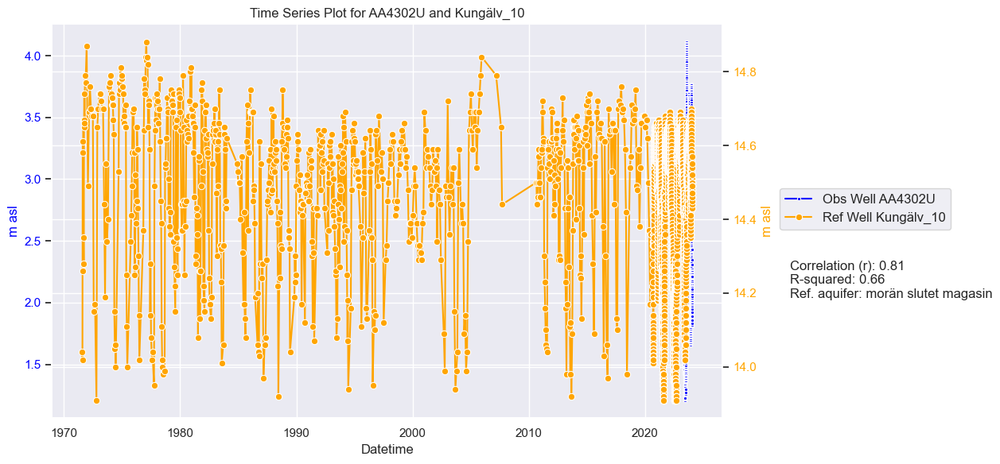

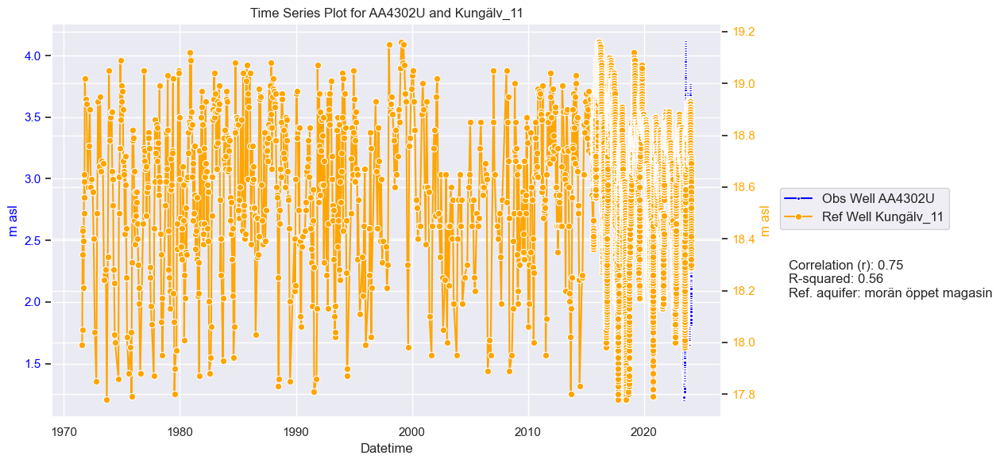

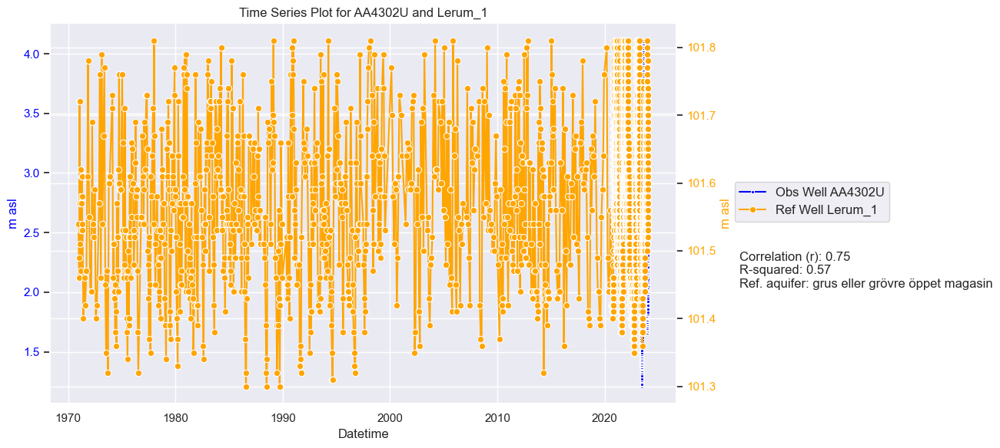

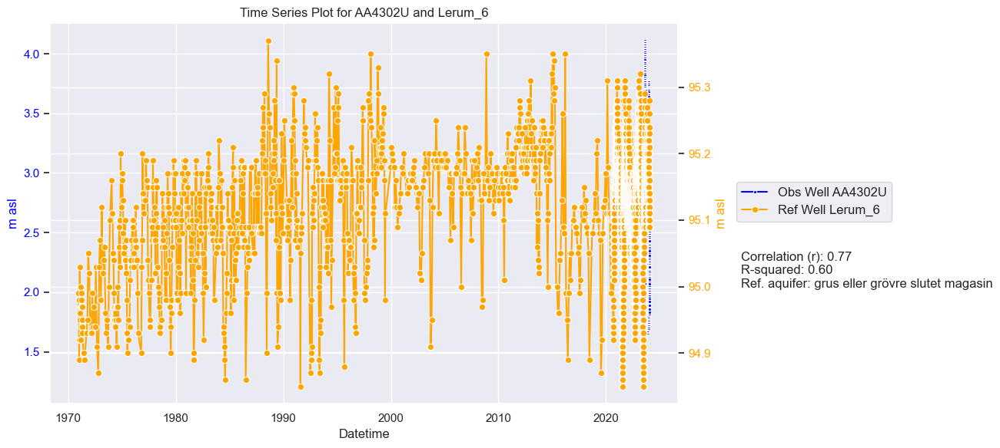

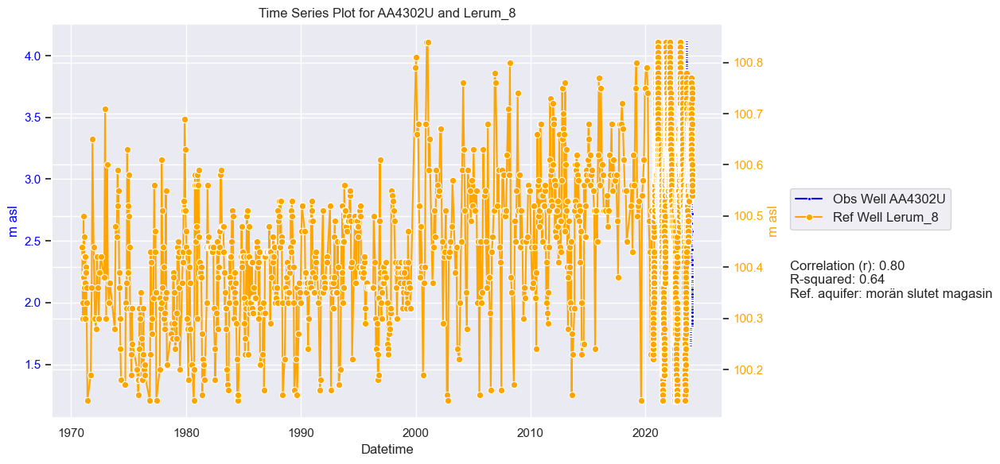

...

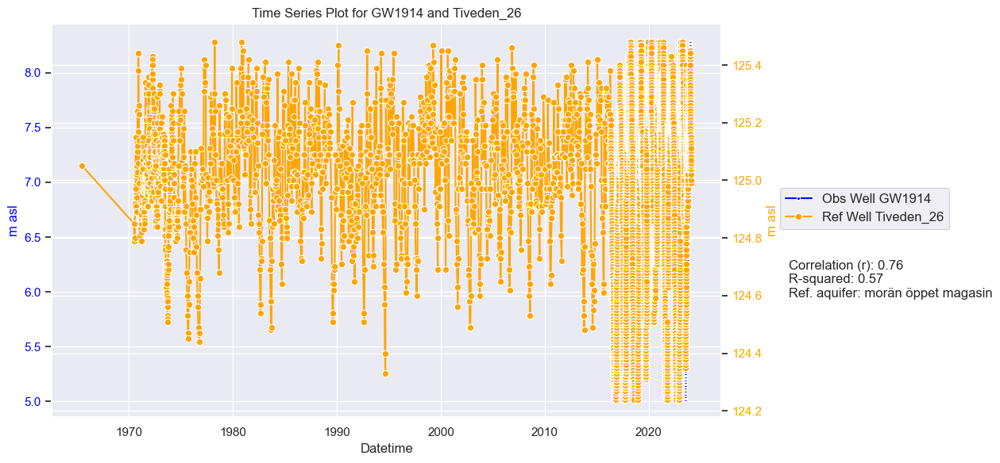

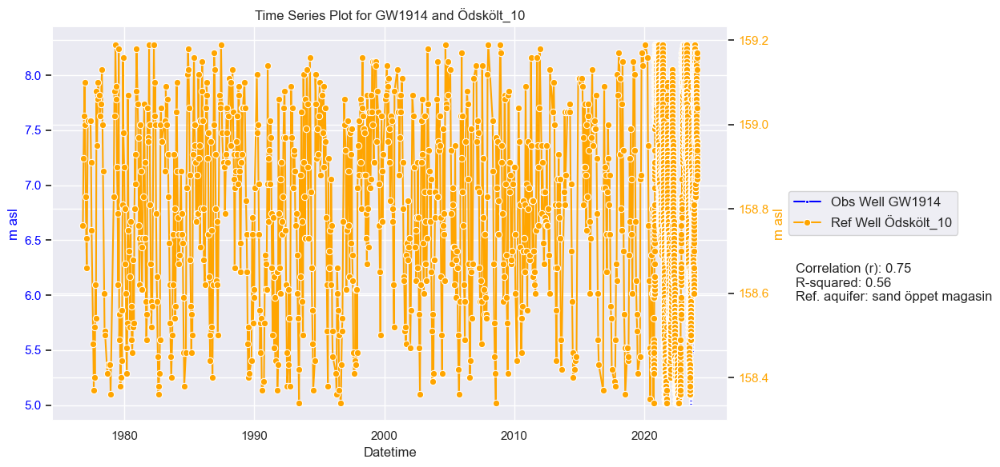

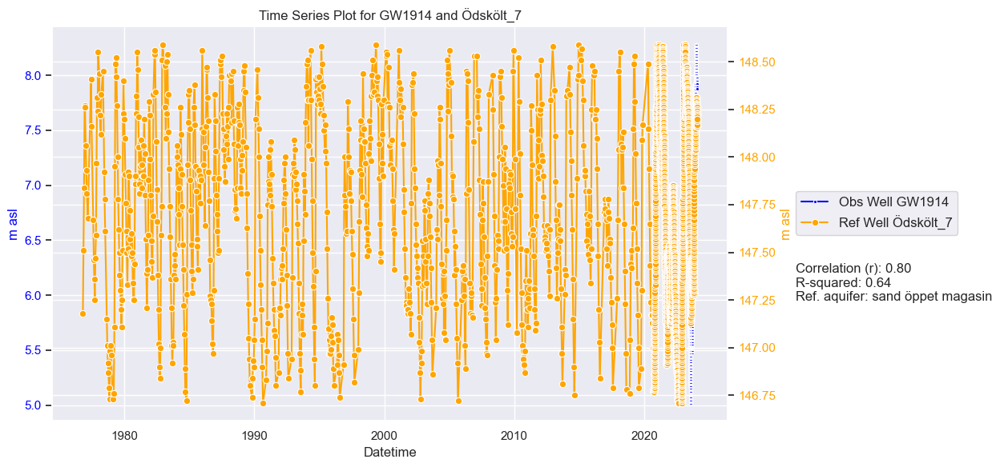

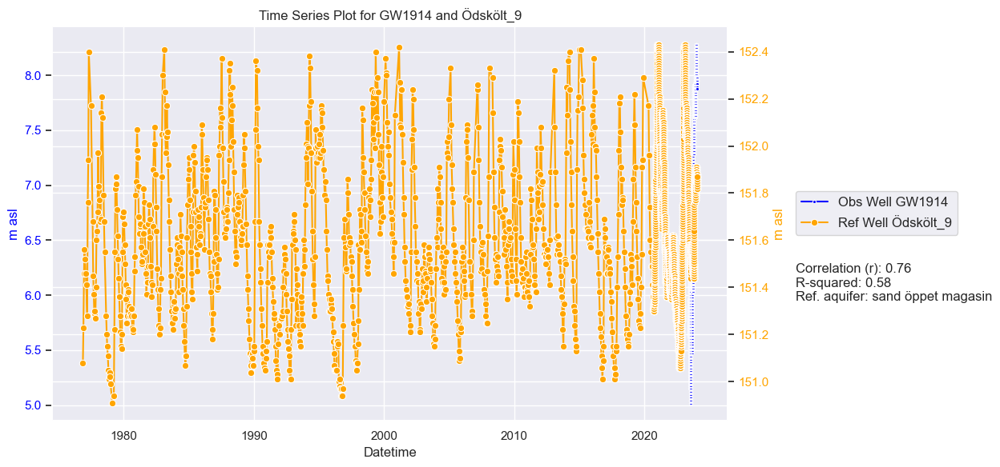

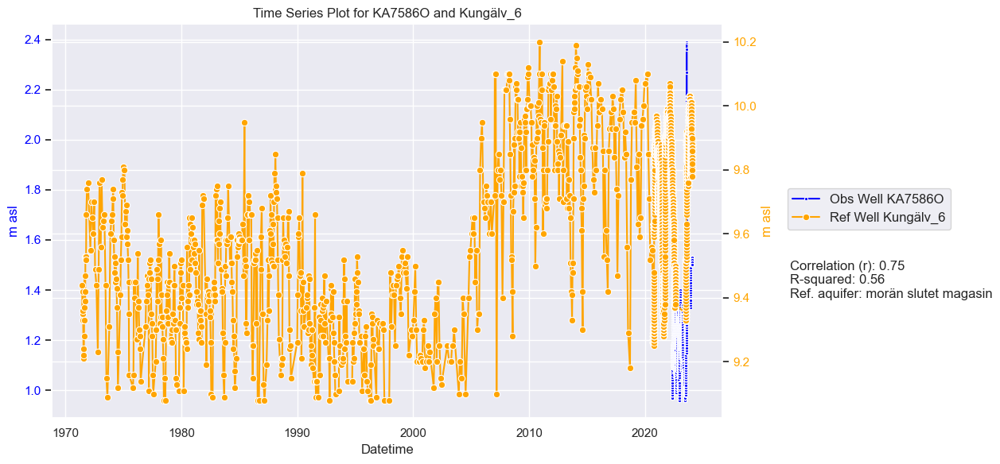

In [310]:
def plot_overlapping_dataframes(overlapping_dfs):
    # Plot each pair of overlapping dataframes
    sns.set_theme()
    for i, (obs_df, ref_df) in enumerate(overlapping_dfs):
        
        fig, axes = plt.subplots(nrows=1, figsize=(16, 6))
        ax1 = axes
        ax2 = ax1.twinx()
        sns.lineplot(data=ref_df, x=ref_df['datetime'], y=ref_df['value'], label=f'Ref Well {ref_df["id"].iloc[0]}', marker='o', ax=ax2, color='orange')
        sns.lineplot(data=obs_df, x=obs_df['datetime'], y=obs_df['m asl'], label=f'Obs Well {obs_df["id"].iloc[0]}', marker='.', ax=ax1, color='blue')
        
        ax1.set_title(f'Time Series Plot for {obs_df["id"].iloc[0]} and {ref_df["id"].iloc[0]}')
        ax1.set_xlabel('Datetime')
        ax1.set_ylabel('m asl', color='blue')
        ax2.set_ylabel('m asl', color='orange')

        ax1.tick_params(axis='y', labelcolor='blue')
        ax2.tick_params(axis='y', labelcolor='orange')

        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', bbox_to_anchor=(1.35, 0.6), fontsize=12)
#         ax1.legend(loc='upper right', fontsize=12)
        ax1.legend().set_visible(False)

        corr = ref_df['coorelation'].unique()[0]
        unit = ref_df['unit'].unique()[0]
        aquifer = ref_df['type'].unique()[0].replace('jord , ', '')
        
        
        textstr = f'Correlation (r): {corr:.2f}\nR-squared: {corr**2:.2f}\nRef. aquifer: {unit} {aquifer}'
        ax1.text(1.1, 0.4, textstr, transform=ax1.transAxes, fontsize=12,
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        plt.tight_layout(rect=[0, 0, 0.85, 1])
        
        plt.show()
#         break
        
# test = [(filtered_observations, filtered_reference)]      
plot_overlapping_dataframes(test)

In [ ]:
def filter_ref_data(obs_data, ref_data):
    # Assuming 'datetime' is the column containing datetime values in both DataFrames
    # Replace it with the actual column name if different
    obs_data['datetime'] = pd.to_datetime(obs_data['datetime'])
    ref_data['datetime'] = pd.to_datetime(ref_data['datetime'])

    # Group by 'id' for both DataFrames
    obs_grouped = obs_data.groupby('id')
    ref_grouped = ref_data.groupby('id')

    # Define a function to check for datetime overlap
    def has_overlap(group):
        obs_min_date = group['datetime'].min()
        obs_max_date = group['datetime'].max()

        ref_group = ref_grouped.get_group(group.name)
        ref_min_date = ref_group['datetime'].min()
        ref_max_date = ref_group['datetime'].max()

        # Check for overlap of at least 3 months (approx. 91 days)
        return (ref_min_date <= obs_max_date) and (obs_min_date <= ref_max_date)

    # Filter 'ref_data' based on overlap
    filtered_ref_data = ref_grouped.filter(has_overlap)

    return filtered_ref_data

# Example usage
# Assuming 'obs_data' and 'ref_data' are your DataFrames
filtered_ref_data = filter_ref_data(obs_data, ref_data)

In [30]:
# access_token, tags_mwr, tags_temp = telecontrolnet.accesstoken()
# telecontrolnet_level_data= telecontrolnet.get_data(access_token, tags_mwr)
# telecontrolnet_temprature_data = telecontrolnet.get_data(access_token, tags_temp)
# telecontrolnet_modify = telecontrolnet.megre_frames(tags_mwr,  telecontrolnet_temprature_data, telecontrolnet_level_data)

telecontrolnet_distance = telecontrolnet.distance_calculation(telecontrolnet_modify, sgu_data_modify)

In [71]:
telecontrolnet_modify

,station_id,id,datetime,m asl,°C,latitude,longitude,city,active
34832,38099902,AA4238U,2020-01-01 01:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34833,38099902,AA4238U,2020-01-01 02:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34834,38099902,AA4238U,2020-01-01 03:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34835,38099902,AA4238U,2020-01-01 04:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34836,38099902,AA4238U,2020-01-01 05:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
...,...,...,...,...,...,...,...,...,...
1719793,43071109-20230614,KA4328H,2024-01-23 21:00:00,1.37,8.7,57.69723,11.994302,UNOSON,1
1719794,43071109-20230614,KA4328H,2024-01-23 22:00:00,1.38,8.7,57.69723,11.994302,UNOSON,1
1719795,43071109-20230614,KA4328H,2024-01-23 23:00:00,1.39,8.7,57.69723,11.994302,UNOSON,1
1719796,43071109-20230614,KA4328H,2024-01-24 00:00:00,1.41,8.7,57.69723,11.994302,UNOSON,1


In [72]:
# df = telecontrolnet_distance.copy()

# Specify columns to keep
columns_to_keep = ['station_id', 'id', 'datetime', 'm asl', '°C', 'latitude', 'longitude',
                   'city', 'active']
telecontrolnet_distance[telecontrolnet_distance.columns.difference(columns_to_keep)] = telecontrolnet_distance[telecontrolnet_distance.columns.difference(columns_to_keep)].apply(lambda x: x.mask(x > 50.0, other=None))

telecontrolnet_distance = telecontrolnet_distance.dropna(axis=1, how='all')

new_columns = telecontrolnet_distance.columns.difference(telecontrolnet_modify.columns)

merged_df = pd.merge(telecontrolnet_modify, telecontrolnet_distance, on=columns_to_keep, how='outer').ffill()

merged_df

,station_id,id,datetime,m asl,°C,latitude,longitude,city,active,distance_Göteborg_1,...,distance_Lerum_14,distance_Lerum_3,distance_Lerum_5,distance_Lerum_6,distance_Lerum_8,distance_Lerum_9,distance_Gårdsjön_GV04,distance_Gårdsjön_GV05,distance_Gårdsjön_GV08,distance_Gårdsjön_GV09
0,38099902,AA4238U,2020-01-01 01:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,28.26,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16
1,38099902,AA4238U,2020-01-01 02:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,28.26,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16
2,38099902,AA4238U,2020-01-01 03:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,28.26,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16
3,38099902,AA4238U,2020-01-01 04:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,28.26,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16
4,38099902,AA4238U,2020-01-01 05:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1,6.31,...,28.26,27.28,27.20,27.82,28.19,28.11,41.25,41.25,41.16,41.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215644,43071109-20230614,KA4328H,2024-01-23 21:00:00,1.37,8.7,57.69723,11.994302,UNOSON,1,5.62,...,28.32,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76
1215645,43071109-20230614,KA4328H,2024-01-23 22:00:00,1.38,8.7,57.69723,11.994302,UNOSON,1,5.62,...,28.32,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76
1215646,43071109-20230614,KA4328H,2024-01-23 23:00:00,1.39,8.7,57.69723,11.994302,UNOSON,1,5.62,...,28.32,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76
1215647,43071109-20230614,KA4328H,2024-01-24 00:00:00,1.41,8.7,57.69723,11.994302,UNOSON,1,5.62,...,28.32,27.36,27.19,27.74,28.13,28.08,39.85,39.85,39.76,39.76


In [22]:


def filter_and_return_data(data, datetime_column, id_column, years_threshold=20):

    # Convert the datetime column to datetime format
    data[datetime_column] = pd.to_datetime(data[datetime_column])

    # Group by 'id' and use the maximum datetime value within each group as the current date
    grouped_data = data.groupby(id_column)
    current_dates = grouped_data[datetime_column].max()
    
    
    if 'years_since_datetime' not in data.columns or data['years_since_datetime'].max() < current_dates.max().year:
    # Calculate the time difference in years within each group
        data['years_since_datetime'] = grouped_data[datetime_column].transform(lambda x: (current_dates[x.name] - x).dt.days / 365.25)

    # Filter rows based on the specified threshold
    filtered_data = data[data['years_since_datetime'] >= years_threshold]

    return filtered_data

# dFrame = []

# for i in sgu_data_modify.id.unique():
    
#     subset = sgu_data_modify.loc[sgu_data_modify.id == i]
#     _sgu_data_filtered = filter_and_return_data(subset, datetime_column='datetime', id_column='id')
#     dFrame.append(_sgu_data_filtered)
    

# sgu_data_filtered = pd.concat(dFrame)

# sgu_data_filtered

sgu_data_filtered = filter_and_return_data(sgu_data_modify, datetime_column='datetime', id_column='id')

In [23]:
sgu_data_filtered[sgu_data_filtered.id == 'Gårdsjön_GV09']

,id,station_id,datetime,value,unit,type,latitude,longitude,years_since_datetime
0,Gårdsjön_GV09,8700_9,1996-01-08,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,26.798084
1,Gårdsjön_GV09,8700_9,1996-05-09,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,26.464066
2,Gårdsjön_GV09,8700_9,1996-06-03,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,26.395619
3,Gårdsjön_GV09,8700_9,1996-10-10,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,26.042437
4,Gårdsjön_GV09,8700_9,1997-04-03,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,25.563313
5,Gårdsjön_GV09,8700_9,1997-10-07,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,25.051335
6,Gårdsjön_GV09,8700_9,1998-02-18,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,24.684463
7,Gårdsjön_GV09,8700_9,1998-07-01,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,24.320329
8,Gårdsjön_GV09,8700_9,1999-01-04,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,23.808350
9,Gårdsjön_GV09,8700_9,2000-01-14,NaN,morän,"jord , okänd typ av magasin",58.053892,12.021082,22.781656


In [10]:
telecontrolnet_modify

,station_id,id,datetime,m asl,°C,latitude,longitude,city,active
34808,38099902,AA4238U,2020-01-01 01:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34809,38099902,AA4238U,2020-01-01 02:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34810,38099902,AA4238U,2020-01-01 03:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34811,38099902,AA4238U,2020-01-01 04:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
34812,38099902,AA4238U,2020-01-01 05:00:00,7.55,10.5,57.68449,12.003110,UNOSON,1
...,...,...,...,...,...,...,...,...,...
1717860,43071109-20230614,KA4328H,2024-01-22 21:00:00,1.45,8.8,57.69723,11.994302,UNOSON,1
1717861,43071109-20230614,KA4328H,2024-01-22 22:00:00,1.44,8.8,57.69723,11.994302,UNOSON,1
1717862,43071109-20230614,KA4328H,2024-01-22 23:00:00,1.45,8.8,57.69723,11.994302,UNOSON,1
1717863,43071109-20230614,KA4328H,2024-01-23 00:00:00,1.44,8.8,57.69723,11.994302,UNOSON,1


In [ ]:
new_columns = telecontrolnet_distance.columns.difference(telecontrolnet_modify.columns)

merged_df = pd.merge(telecontrolnet_modify, telecontrolnet_distance, on=['id', 'station_id', 'datetime', 'm asl', '°C', 'latitude', 'longitude', 'city', 'active'], how='outer').ffill()

merged_df

In [ ]:
telecontrolnet.plot_sgu_and_telecontrolnet(sgu_data_modify, telecontrolnet_modify)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
import warnings


warnings.filterwarnings("ignore", "is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead.")
warnings.filterwarnings("ignore", "use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.")

sns.set_theme()

# Plotting on individual figures
unique_ids = telecontrolnet_modify['id'].unique()
unique_sgu_ids = sgu_data_modify['id'].unique()




for nr in unique_sgu_ids:
    subset = sgu_data_modify.loc[sgu_data_modify.id == nr]
    
    subset.loc[:,'datetime'] = pd.to_datetime(subset['datetime'], format='%Y-%m-%d %H:%M:%S')
    subset.set_index('datetime', inplace=True)

    # Resample 'm asl' to daily values using mean aggregation
    resampled_sgu = subset['value'].resample('D').mean().reset_index()
    resampled_sgu['datetime'] = pd.to_datetime(resampled_sgu['datetime'].dt.strftime('%Y-%m-%d') + ' 12:00:00')

    # Convert the 'datetime' column back to datetime type
    resampled_sgu['datetime'] = pd.to_datetime(resampled_sgu['datetime'], format='%Y-%m-%d %H:%M:%S')
    resampled_sgu['id'] = nr
    resampled_sgu = resampled_sgu.dropna()
    
   
    for i, unique_id in enumerate(unique_ids):
        
        subset_df = telecontrolnet_modify[telecontrolnet_modify['id'] == unique_id]
        subset_df.loc[:,'datetime'] = pd.to_datetime(subset_df['datetime'], format='%Y-%m-%d %H:%M:%S')
        subset_df.set_index('datetime', inplace=True)

        # Resample 'm asl' to daily values using mean aggregation
        resampled_df = subset_df['m asl'].resample('D').mean().reset_index()
        resampled_df['datetime'] = pd.to_datetime(resampled_df['datetime'].dt.strftime('%Y-%m-%d') + ' 12:00:00')

        # Convert the 'datetime' column back to datetime type
        resampled_df['datetime'] = pd.to_datetime(resampled_df['datetime'], format='%Y-%m-%d %H:%M:%S')
        resampled_df['id'] = unique_id


        resampled_sgu.loc[:,'datetime'] = pd.to_datetime(resampled_sgu['datetime'], format='%Y-%m-%d %H:%M:%S')
        
        resampled_sgu = resampled_sgu.loc[
            (resampled_sgu['datetime'] >= resampled_df['datetime'].min()) &
            (resampled_sgu['datetime'] <= resampled_df['datetime'].max())
        ]
        
        resampled_df = resampled_df.loc[
            (resampled_df['datetime'] >= resampled_sgu['datetime'].min()) &
            (resampled_df['datetime'] <= resampled_sgu['datetime'].max())
        ]


        if not resampled_sgu.empty and not resampled_df.empty:
            scaler_m_asl = StandardScaler()
            scaler_value = StandardScaler()

            resampled_sgu['value'] = scaler_value.fit_transform(resampled_sgu[['value']])
            resampled_df['m asl'] = scaler_m_asl.fit_transform(resampled_df[['m asl']])
        
        
        aligned_df = pd.merge_asof(
            resampled_sgu.sort_values('datetime'),
            resampled_df.sort_values('datetime'),
            on='datetime'
        )
        # Check if 'aligned_df' DataFrame is not empty before calculating correlation
#         if len(aligned_df) > 0:
        if len(aligned_df) > 0 and len(aligned_df['value'].dropna()) > 1 and len(aligned_df['m asl'].dropna()) > 1:
            # Calculate correlation and standardize it
            aligned_df = aligned_df.replace([np.inf, -np.inf], np.nan).dropna()
            corr, _ = pearsonr(aligned_df['value'], aligned_df['m asl'])
            
    
            if corr > 0.7:
                fig, axes = plt.subplots(nrows=1, figsize=(16, 6))
                ax1 = axes
                ax2 = ax1.twinx()

                sns.lineplot(data=resampled_df, x='datetime', y='m asl', marker='o', ax=ax1, label=unique_id, color='blue')
                sns.lineplot(data=resampled_sgu, x='datetime', y='value', marker='.', ax=ax1, label=nr, color='orange')

                ax1.set_title(f'Time Series Plot for {unique_id}')
                ax1.set_xlabel('Datetime')
                ax1.set_ylabel('Standard Scaler', pad=15)
                ax2.set_ylabel('m asl', color='orange')

                ax1.tick_params(axis='y', labelcolor='blue')
                ax2.tick_params(axis='y', labelcolor='orange')

                lines, labels = ax1.get_legend_handles_labels()
                lines2, labels2 = ax2.get_legend_handles_labels()
                ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)
                ax1.legend(loc='upper right', fontsize=12)
                
                
                textstr = f'Correlation (r): {corr:.2f}\nR-squared: {corr**2:.2f}'
                ax1.text(0.05, 0.95, textstr, transform=ax1.transAxes, fontsize=12,
                         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))



    plt.tight_layout()
    plt.show()





In [ ]:
 def megre_frames(tags_level, df_temp, df_level):


        def _modify_level_data(df):
            # Convert to datetime and handle timezone formate
            df['logtime'] = pd.to_datetime(df['logtime']).dt.strftime("%Y-%m-%d %H:%M:%S")  
            # Rename columns 
            df = df.rename(columns={'logtime':'datetime', 'logvalue':'m asl'})
            # Convert datetime and value to nummeric 
            df['datetime'] = pd.to_datetime(df['datetime'])
            df['m asl'] = pd.to_numeric(df['m asl'], errors='coerce')
            # Convert centimeter to meter
            df['m asl'] = (df['m asl'] / 100).round(2)
        
            df = df[['id', 'datetime', 'm asl']].copy()
            return df
        
        def _modify_temprature_data(df):
            # Convert to datetime and handle timezone formate
            df['logtime'] = pd.to_datetime(df['logtime']).dt.strftime("%Y-%m-%d %H:%M:%S")  
            # Rename columns 
            df = df.rename(columns={'logtime':'datetime', 'logvalue':'°C'})
            # Convert datetime and value to nummeric 
            df['datetime'] = pd.to_datetime(df['datetime'])

            df['°C'] = pd.to_numeric(df['°C'], errors='coerce').round(1)
            df = df[['id', 'datetime', '°C']].copy()

            return df
        
        df_level = _modify_level_data(df_level)
        df_temp = _modify_temprature_data(df_temp)

        dFrame = df_level.merge(df_temp, on=['id', 'datetime'], how='outer')
        dFrame_level = dFrame.merge(tags_level, on='id', how='left')

        tags_x = dict(zip(tags_level['name'], tags_level['x']))
        tags_y = dict(zip(tags_level['name'], tags_level['y']))
        tags_city = dict(zip(tags_level['name'], tags_level['city']))
        tags_active = dict(zip(tags_level['name'], tags_level['active']))
        tags_id = dict(zip(tags_level['name'], tags_level['id']))

        for i in tags_x.keys():
            dFrame_level.loc[dFrame_level['id'] == i, 'name'] = tags_id[i]
            dFrame_level.loc[dFrame_level['id'] == i, 'x'] = tags_x[i]
            dFrame_level.loc[dFrame_level['id'] == i, 'y'] = tags_y[i]
            dFrame_level.loc[dFrame_level['id'] == i, 'city'] = tags_city[i]
            dFrame_level.loc[dFrame_level['id'] == i, 'active'] = tags_active[i]
            

        dFrame_level = dFrame_level[['name', 'id', 'datetime', 'm asl', '°C', 'x', 'y', 'city', 'active']].copy()
        dFrame_level.rename(columns={'x':'latitude', 'y':'longitude', 'name':'station_id'}, inplace=True)
        dFrame_level = dFrame_level.dropna()
        
        return dFrame_level
    
telecontrolnet_modify = megre_frames(tags_mwr,  telecontrolnet_temprature_data, telecontrolnet_level_data)

In [ ]:
from geopy.distance import geodesic

def distance_calculation(df1, df2):
    
    df1 = df1.drop_duplicates(subset='id').copy().dropna(subset=['latitude', 'longitude'])
    df2 = df2.drop_duplicates(subset='id').copy().dropna(subset=['latitude', 'longitude'])

    # Create an empty DataFrame to store distances
    distance_df = pd.DataFrame()

    def haversine_distance(coord1, coord2):
        return geodesic(coord1, coord2).kilometers
    
    # Calculate distances for each unique ID
    for unique_id_1 in df1['id'].unique():
        # Extract coordinates for the current ID from both DataFrames
        coords_df1 = df1.loc[df1['id'] == unique_id_1, ['latitude', 'longitude']].values[0]
        temp_data = {'id': [unique_id_1]}
        for unique_id_2 in df2['id'].unique():
            coords_df2 = df2.loc[df2['id'] == unique_id_2, ['latitude', 'longitude']].values[0]
            # Calculate distance using Haversine formula
            distance = haversine_distance(coords_df1, coords_df2)
            
            # Store the distance in the temp_data dictionary
            temp_data[f'distance_{unique_id_2}'] = [round(distance, 2)]

        # Convert temp_data to DataFrame and store it in distance_df
        temp_df = pd.DataFrame(temp_data)
        distance_df = pd.concat([distance_df, temp_df])

    # Merge the distance_df with the original df1
    df1 = pd.merge(df1, distance_df, on='id', how='left')

    return df1
        
    
df1 = distance_calculation(telecontrolnet_modify, sgu_data_)

In [ ]:
telecontrolnet_modify.head()

In [ ]:
sgu_data_.id.unique()

In [ ]:
smhi_precipitation_.head()

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import math

app = dash.Dash(__name__)




# Mock data
# Replace these with your actual data loading logic
groundwater_data = telecontrolnet_modify
sgu_data = sgu_data_
df_precipitation = smhi_precipitation_

@app.callback(
    Output('graph', 'figure'),
    [Input('date-range-slider', 'value'),
     Input('hide-show-ids', 'value'),
     Input('sgu-dropdown', 'value'),
     Input('sgu-scale-slider', 'value')]
)
def update_graph(selected_date_range, hide_show_ids=None, selected_sgu_id=None, sgu_scale):
        start_date, end_date = selected_date_range

        # Data processing
        df_start_to_end_date = groundwater_data.loc[
            (groundwater_data['datetime'] >= start_date)
            & (groundwater_data['datetime'] <= end_date)
        ].reset_index(drop=True)

        df_groundwater = df_start_to_end_date[['id', 'datetime', 'value']].copy()
        df_groundwater = df_groundwater.dropna(subset=['value', 'datetime'])
        df_groundwater['datetime'] = pd.to_datetime(df_groundwater['datetime'])
        df_groundwater_grouped = df_groundwater.groupby(['id', pd.Grouper(key='datetime', freq='D')])['value'].mean().reset_index()

        # Optionally, if you want to fill missing dates with NaN
        df_groundwater_grouped = df_groundwater_grouped.pivot(index='datetime', columns='id', values='value').reset_index()

        df_precipitation_subset = df_precipitation.loc[
            (df_precipitation.datetime >= start_date)
            & (df_precipitation.datetime <= end_date)
        ].copy().reset_index(drop=True)
        df_precipitation_subset['datetime'] = pd.to_datetime(df_precipitation_subset['datetime'])
        df_precipitation_subset = df_precipitation_subset.resample('D')['value'].sum().reset_index()

        date_range = df_precipitation['datetime'].max() - df_precipitation['datetime'].min()
        num_days = date_range.days
        bar_width = math.ceil(num_days / len(df_precipitation))

        markers_array = ['o', '-', 'x', '+', 'v', '^', '<', '>', 's', 'd', 'p', '*']
        marker_size = 4 
        colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'black', 'yellow']

        sgu_df_subset = sgu_data.loc[
            (sgu_data['datetime'] >= sgu_data['datetime'].min())
            & (sgu_data['datetime'] <= end_date)
        ].reset_index(drop=True)

        sgu_df_subset = sgu_df_subset[['id', 'datetime', 'value']].copy()
        sgu_df_subset = sgu_df_subset.dropna(subset=['value', 'datetime'])
        sgu_df_subset['datetime'] = pd.to_datetime(sgu_df_subset['datetime'])

        sgu_df_groundwater_grouped = sgu_df_subset.groupby(['id', pd.Grouper(key='datetime', freq='D')])['value'].mean().reset_index()

        # Optionally, if you want to fill missing dates with NaN
        sgu_df_groundwater_grouped = sgu_df_groundwater_grouped.pivot(index='datetime', columns='id', values='value').reset_index()

        # Hide/Show IDs
        if hide_show_ids is not None:
            for id_to_hide in hide_show_ids:
                if id_to_hide in df_groundwater_grouped.columns:
                    df_groundwater_grouped[id_to_hide] = None
                if id_to_hide in sgu_df_groundwater_grouped.columns:
                    sgu_df_groundwater_grouped[id_to_hide] = None

        # Plotting
        sns.set(font_scale=1.3)
        sns.set_style('whitegrid', {"grid.color": "0.6", "grid.linestyle": ":"})

        fig, axs = plt.subplots(1, 1, figsize=(16, 6), dpi=300)
        axs2 = axs.twinx()
        axs2.bar(
            df_precipitation_subset['datetime'],
            df_precipitation_subset['value'].astype(float),
            alpha=0.8,
            color='blue',
            label='Precipitation',
        )

        for column in df_groundwater_grouped.columns[1:]:
            axs.plot(
                df_groundwater_grouped['datetime'],
                df_groundwater_grouped[column],
                label=column,
                lw=3,
                alpha=0.9,
            )

        for column in sgu_df_groundwater_grouped.columns[1:]:
            axs.plot(
                sgu_df_groundwater_grouped['datetime'],
                sgu_df_groundwater_grouped[column] * sgu_scale,
                label=column,
                lw=3,
                alpha=0.9,
                color='red'
            )

        axs.legend(loc='center left', bbox_to_anchor=(1.1, 0.5))
        axs.set_ylabel(' m asl ', fontsize='16', labelpad=15)
        axs2.set_ylabel(' mm ', fontsize='16', rotation=-90, labelpad=25)

        if df_precipitation_subset.value.astype(float).max() < 25:
            axs2.set_ylim(0, 25)
        elif df_precipitation_subset.value.astype(float).max() < 50:
            axs2.set_ylim(0, df_precipitation_subset.value.astype(float).max() + 10)
        else:
            axs2.set_ylim(0, 50)

        axs.xaxis.set_major_formatter(mdates.DateFormatter("%d %b %Y"))  # Set the date format

        plt.tight_layout()
        plt.show()


        return {'data': [], 'layout': {}}

# Example usage:
# Update the actual data with your loaded data
groundwater_data = telecontrolnet_modify
sgu_data = sgu_data_
df_precipitation = smhi_precipitation_

app.layout = html.Div([
    dcc.RangeSlider(
        id='date-range-slider',
        min=0,
        max=10,
        step=1,
        marks={i: {'label': f'Day {i}'} for i in range(11)},
        value=[0, 10]
    ),
    dcc.Checklist(
        id='hide-show-ids',
        options=[{'label': str(id), 'value': str(id)} for id in groundwater_data['id'].unique()],
        value=[]
    ),
    dcc.Dropdown(
        id='sgu-dropdown',
        options=[{'label': str(id), 'value': str(id)} for id in sgu_data['id'].unique()],
        value=sgu_data['id'].iloc[0]
    ),
    dcc.Slider(
        id='sgu-scale-slider',
        min=0.1,
        max=2,
        step=0.1,
        marks={i/10: str(i/10) for i in range(1, 21)},
        value=1
    ),
    dcc.Graph(id='graph')
])

# Run the app in the notebook
app.run_server(mode='inline')
    
    
update_graph(('2021-01-01', '2023-12-22'), hide_show_ids, selected_sgu_id, '1')

In [ ]:
df_groundwater_grouped

In [ ]:
sgu_df_groundwater_grouped

In [ ]:
df_precipitation

In [ ]:
smhi.set_data_type('precipitation')
smhi.set_station()
smhi.print_station_ids()
smhi_precipitation = smhi.fetch_data()

# smhi.set_data_type('temperature')
# smhi_temperature = smhi.fetch_data()

# smhi.set_data_type('air_pressure')
# smhi_air_pressure = smhi.fetch_data()

In [ ]:
path = os.path.join('00 - Metadata', 'sgu_metadata.xlsx')
metadata = pd.read_excel(path)
# metadata = sgu.fetch_stations(lanskod=14)

metadata['Stationens namn'].unique() 



# metadata.loc[metadata['Stationens namn'].isin(list_of_ids)]

# sgu_data = sgu.fetch_measurements(metadata)


# sgu_standard = geolocator.sweref_to_lat_lon(sgu_data)
# sgu_standard_ = sgu.convert_columns_to_standard(sgu_standard)


# sgu_standard_ = sgu_standard_.dropna(subset=['latitude', 'longitude'])
# sgu_standard_unique = sgu_standard_.drop_duplicates(subset=['latitude', 'longitude'])

# dFrames = []
# for index, row in sgu_standard_unique.iterrows():
#     sgu_standard__ = geolocator.get_reverse_geocode(sgu_standard_, (row['latitude'], row['longitude']), os.environ.get('OPENCAGE_API_KEY'))
#     # Append a copy of the DataFrame to the list
#     dFrames.append(sgu_standard__.copy())
    
# sgu_data_df = pd.concat(dFrames)

# sgu_data_df

In [ ]:
telecontrolnet_modify.to_csv('telecontrolnet_modify.csv')

In [ ]:
telecontrolnet_modify.head()

In [ ]:
sgu_data_.head()

In [ ]:
def plot_groundwater_level_(
    groundwater_data, precipitation_data, sgu_data, start_date=None, end_date=None
):
    # Data processing
    df_start_to_end_date = groundwater_data.loc[
        (groundwater_data['datetime'] >= start_date)
        & (groundwater_data['datetime'] <= end_date)
    ].reset_index(drop=True)

    df_groundwater = df_start_to_end_date[['id', 'datetime', 'value']].copy()
    df_groundwater = df_groundwater.dropna(subset=['value', 'datetime'])
    df_groundwater['datetime'] = pd.to_datetime(df_groundwater['datetime'])
    df_groundwater.set_index('datetime', inplace=True)
    df_groundwater = df_groundwater.resample('D')['value'].mean().reset_index()

#     print(df_groundwater)

    df_precipitation = precipitation_data.loc[
        (precipitation_data.datetime >= start_date)
        & (precipitation_data.datetime <= end_date)
    ].copy().reset_index(drop=True)
    df_precipitation['datetime'] = pd.to_datetime(df_precipitation['datetime'])

    df_precipitation.set_index('datetime', inplace=True)
    df_precipitation = df_precipitation.resample('D')['value'].sum().reset_index()
#     print(df_precipitation)
    
    date_range = precipitation_data['datetime'].max() - precipitation_data['datetime'].min()
    num_days = date_range.days
    bar_width = math.ceil(num_days / len(precipitation_data))

   
    markers_array = ['o', 'x', '+', 'v', '^', '<', '>', 's', 'd', 'p', '*']
    marker_size = 4 
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'black', 'yellow']
    sgu_data_filtered = sgu_data.loc[
        (sgu_data['datetime'] >= start_date)
        & (sgu_data['datetime'] <= end_date)
    ].reset_index(drop=True)

    sgu_df = sgu_data_filtered[['id', 'datetime', 'value']].copy()
    sgu_df = sgu_df.dropna(subset=['value', 'datetime'])

    sgu_df['value'] = pd.to_numeric(sgu_df['value'], errors='coerce')

    # Group by 'id' and resample 'datetime' to daily values, calculating the mean
    sgu_df_resampled = sgu_df.groupby(['id', pd.Grouper(key='datetime', freq='D')])['value'].mean().reset_index()
    print(sgu_df_resampled)


    # Plotting
    sns.despine(top=True)
    sns.set(font_scale=1.3)
    sns.set_style('whitegrid', {"grid.color": "0.6", "grid.linestyle": ":"})

    fig, axs = plt.subplots(1, 1, figsize=(16, 6), dpi=300)
    axs2 = axs.twinx()
    axs2.bar(
        df_precipitation['datetime'],
        df_precipitation['value'].astype(float),
        width=int(bar_width),
        alpha=0.5,
        color='lightblue',
        label='Precipitation',
    )

    axs.plot(
        df_groundwater['datetime'],
        df_groundwater['value'],
        label='Göteborg_1',
        lw=3,
        alpha=0.9,
        marker=markers_array[0],
        markersize=marker_size,
    )
    for index, i in enumerate(sgu_df_resampled.id.unique()):
        subset = sgu_df_resampled.loc[sgu_df_resampled['id'] == i]

        axs.plot(
            subset['datetime'],
            subset['value'],
            label=i,
            lw=3,
            alpha=0.9,
            marker=markers_array[index + 1],
            markersize=marker_size,
            color = colors[index + 1]

        )


    axs.legend(loc='center left', bbox_to_anchor=(1.1, 0.5))
    axs.set_ylabel(' m asl ', fontsize='16', labelpad=15)
    axs2.set_ylabel(' mm ', fontsize='16', rotation=-90, labelpad=25)

    if df_precipitation.value.astype(float).max() < 25:
        axs2.set_ylim(0, 25)
    elif df_precipitation.value.astype(float).max() < 50:
        axs2.set_ylim(0, df_precipitation.value.astype(float).max() + 10)
    else:
        axs2.set_ylim(0, 50)

    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d %b %Y"))
    plt.tight_layout()
    plt.show()

In [ ]:
smhi_precipitation_.head(2)

In [ ]:
telecontrolnet_modify.head(2)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def plot_groundwater_level_(
    groundwater_data, precipitation_data, sgu_data, list_of_ids, start_date=None, end_date=None
):
    # Data processing for groundwater
    df_start_to_end_date = groundwater_data.loc[
        (groundwater_data['datetime'] >= start_date)
        & (groundwater_data['datetime'] <= end_date)
    ].reset_index(drop=True)

    df_groundwater = df_start_to_end_date[['id', 'datetime', 'value']].copy()
    df_groundwater = df_groundwater.dropna(subset=['value', 'datetime'])
    df_groundwater['datetime'] = pd.to_datetime(df_groundwater['datetime'])
    df_groundwater.set_index('datetime', inplace=True)
    df_groundwater = df_groundwater.resample('D')['value'].mean().reset_index()

    # Create a new DataFrame for id values
    df_ids = pd.DataFrame({'id': groundwater_data['id'].unique()})
    
#     print(df_ids.iloc[0,0])
    df_groundwater['id'] = df_ids.iloc[0,0]
#     print(df_groundwater)
    df_groundwater = pd.merge(df_ids, df_groundwater, on='id', how='left')
    print(df_groundwater)
    # Data processing for precipitation
    df_precipitation = precipitation_data.loc[
        (precipitation_data.datetime >= start_date)
        & (precipitation_data.datetime <= end_date)
    ].copy().reset_index(drop=True)
    df_precipitation['datetime'] = pd.to_datetime(df_precipitation['datetime'])
    df_precipitation.set_index('datetime', inplace=True)
    df_precipitation = df_precipitation.resample('D')['value'].sum().reset_index()

    # Min-Max scaling for groundwater and precipitation values for each ID
    scaler = MinMaxScaler()

    for id in list_of_ids:
        # Groundwater data
        subset_groundwater = df_groundwater[df_groundwater['id'] == id]
        df_groundwater.loc[df_groundwater['id'] == id, 'value_scaled'] = scaler.fit_transform(subset_groundwater[['value']])

        # Precipitation data
        subset_precipitation = df_precipitation[df_precipitation['id'] == id]
        df_precipitation.loc[df_precipitation['id'] == id, 'value_scaled'] = scaler.fit_transform(subset_precipitation[['value']])

    # ... (your existing code)

    axs.plot(
        df_groundwater['datetime'],
        df_groundwater['value_scaled'],  # Plot the scaled values
        label='Göteborg_1',
        lw=3,
        alpha=0.9,
        marker=markers_array[0],
        markersize=marker_size,
    )

    for id in list_of_ids:
        subset = sgu_df_resampled[sgu_df_resampled['id'] == id]

        axs.plot(
            subset['datetime'],
            subset['value'],
            label=id,
            lw=3,
            alpha=0.9,
            marker=markers_array[index + 1],
            markersize=marker_size,
            color=colors[index + 1]
        )

    # ... (your existing code)

    plt.show()

# Call the function with your data
list_of_ids = ['Lerum_10', 'Lerum_101', 'Lerum_102', 'Lerum_103', 'Lerum_11', 'Lerum_12', 'Lerum_13', 
               'Lerum_14', 'Göteborg_1', 'Göteborg_2', 'Göteborg_3', 'Göteborg_4']
plot_groundwater_level_(subset, smhi_precipitation_, sgu_data_, list_of_ids, start_date=subset.datetime.min(), end_date=subset.datetime.max())


In [ ]:
from scipy import stats
from plot import *

for key in telecontrolnet_modify.id.unique():
    
    subset = telecontrolnet_modify.loc[telecontrolnet_modify.id == key]
    subset = subset.copy()
    subset.loc[:,'value_zscore'] = stats.zscore(subset['value'], nan_policy='omit')
    
    print(subset.datetime.min(), subset.datetime.max())
    
    print(f"Length dataframe {key}: {len(subset)}")
    subset = subset.loc[(subset.value_zscore <= 2) & (subset.value_zscore >= -2)].reset_index(drop=True).copy()
    print(f"Length dataframe {key} after zscore: {len(subset)}")
    plot_groundwater_level_(subset, smhi_precipitation_, sgu_data_, start_date=subset.datetime.min(), end_date=subset.datetime.max())
    

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler



def calculate_similarity_matrix(df, identifier_col='id', value_col='value'):
#     df = df.dropna(subset='value')
    unique_ids = df[identifier_col].unique()
    similarity_matrix = pd.DataFrame(index=unique_ids, columns=unique_ids)

    for id1 in unique_ids:
        for id2 in unique_ids:
            if id1 != id2:
                series1 = df[df[identifier_col] == id1].set_index('date')[value_col]
                series2 = df[df[identifier_col] == id2].set_index('date')[value_col]

                if series1.isna().any() or series2.isna().any():
                    print(f"Warning: NaN values encountered for identifiers {id1} and {id2}")
                    similarity = None
                else:
                    # Normalize the values
                    scaler = StandardScaler()
                    normalized_series1 = scaler.fit_transform(series1.values.reshape(-1, 1)).flatten()
                    normalized_series2 = scaler.fit_transform(series2.values.reshape(-1, 1)).flatten()

                    # Calculate Pearson correlation coefficient as a similarity measure
                    similarity = pd.Series(normalized_series1).corr(pd.Series(normalized_series2))

                # Store the similarity value in the similarity matrix
                similarity_matrix.loc[id1, id2] = similarity

    return similarity_matrix

def plot_similarity_heatmap(similarity_matrix):
    plt.figure(figsize=(10, 8))
    sns.heatmap(similarity_matrix.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f", linewidths=.5)
    plt.title('Time Series Similarity Heatmap')
    plt.show()
    
    


df_ = df.loc[df.id.str.contains('Göteborg')]
# Calculate similarity matrix
similarity_matrix = calculate_similarity_matrix(df_)

# Plot heatmap
plot_similarity_heatmap(similarity_matrix)


In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import StandardScaler

def normalize_and_categorize_groundwater_level(df, identifier_col='id', date_col='date', value_col='value', period=365):
    # Create empty lists to store the results
    well_ids, date_list, normalized_levels, categories = [], [], [], []
    
    df = df.dropna()
    unique_well_ids = df[identifier_col].unique()

    for well_id in unique_well_ids:
        # Extract time series data for the current well
        ts_data = df[df[identifier_col] == well_id].set_index(date_col)[value_col]

        # Normalize the time series
        scaler = StandardScaler()
        normalized_groundwater_level = scaler.fit_transform(ts_data.values.reshape(-1, 1)).flatten()

        # Decompose the time series to identify trend and seasonality
        decomposition = seasonal_decompose(ts_data, period=period)

        # Categorize based on the presence of trend and seasonality
        trend_present = not np.all(np.isnan(decomposition.trend))
        seasonal_present = not np.all(np.isnan(decomposition.seasonal))
        
        if trend_present and seasonal_present:
            category = 'both'
        elif trend_present:
            category = 'trend'
        elif seasonal_present:
            category = 'seasonal'
        else:
            category = 'none'

        # Append the results to the lists
        well_ids.append(well_id)
        date_list.append(ts_data.index)
        normalized_levels.append(normalized_groundwater_level)
        categories.append(category)

    # Create the result DataFrame
    result_df = pd.DataFrame({
        identifier_col: well_ids,
        date_col: date_list,
        'normalized_groundwater_level': normalized_levels,
        'category': categories
    })

    return result_df


def plot_normalized_groundwater_levels(df, identifier_col='id', date_col='date', value_col='normalized_groundwater_level'):
    unique_ids = df[identifier_col].unique()

    for well_id in unique_ids:
        well_data = df[df[identifier_col] == well_id]
        dates = well_data[date_col].explode()
        values = well_data[value_col].explode()
        
        # Convert the date column to datetime format if not already
        dates= pd.to_datetime(dates)
        
        # Calculate the date range and get the first day of each month
        date_range = pd.date_range(start=dates.min(), end=dates.max(), freq='MS')
        
        # Extract the corresponding values for the first day of each month
        values = well_data.groupby(well_data[date_col].dt.to_period("M")).first()[value_col]
        print(values)
#         plt.figure(figsize=(12, 6))
#         plt.plot(date_range, values, marker='o', linestyle='-', label=f'{well_id} - Category: {well_data["category"].iloc[0]}')
#         plt.title('Normalized Groundwater Levels Over Time')
#         plt.xlabel('Date')
#         plt.ylabel('Normalized Groundwater Level')
#         plt.xticks(rotation=45, ha='right')
#         plt.legend()
#         plt.tight_layout()
#         plt.show()
# Example usage:
# Assuming df is your DataFrame with columns 'id', 'date', 'normalized_groundwater_level', and 'category'

# Example usage:
# Assuming df is your groundwater level time series DataFrame with 'well_id', 'date', and 'groundwater_level' columns
# result_groundwater = normalize_and_categorize_groundwater_level(df)

plot_normalized_groundwater_levels(result_groundwater)
# Display the result
# result_groundwater

In [ ]:
result_groundwater.describe()

In [ ]:
result_groundwater['date'][0]

In [ ]:
df_resampled = df_resampled.dropna(subset=['date'])
df_resampled.describe()

In [ ]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Suppress FutureWarnings related to is_categorical_dtype
warnings.simplefilter(action='ignore', category=FutureWarning)


def plot_grouped_data(df):
    # Set the Seaborn style
    
    df['date'] = pd.to_datetime(df['date'])
    
    df = df.loc[df.city == 'Göteborg'].dropna(subset=['value', 'date']).sort_values(by=['id', 'date'])
    
    df_ = df.loc[df.id.str.contains('Göteborg')]
    

    
    df_downsampled = df_.sample(frac=0.1).sort_values(by=['id', 'date'])
    
    
#     print(df_, df_downsampled)
    sns.set(style="darkgrid")

    # Create a relplot using 'id', 'unit', 'date', and 'value'
    g = sns.relplot(data=df_downsampled, x='date', y='value', hue='id', row='unit',
                    kind='line', aspect=1.5, height=4, markers=True)

    # Set plot labels and title
    g.set_axis_labels('Date', 'Value')

    # Manually set titles for each subplot
    for ax, col_name in zip(g.axes.flat, df_downsampled['unit'].unique()):
        ax.set_title(f"Aqvifer: {col_name}")

    # Adjust legend
    g.add_legend(title='Sensor ID')

    # Show the plot
    plt.show()
    


plot_grouped_data(df)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def calculate_full_timeseries_comparison(df, threshold=0.85):
    # Print columns to identify the correct column names
    print(df.columns)
    
    # Replace 'your_identifier_column' with the correct column name for grouping
    unique_time_series = df.groupby('your_identifier_column')['value'].unique()

    # Plot the distribution of time series lengths
    plot_distribution(unique_time_series)

    # Calculate the similarity between full time series
    similarity_summary = calculate_similarity(unique_time_series)

    # Create a new column for unique 'your_identifier_column' and set boolean values based on the threshold
    df['UniqueCategory'] = df['your_identifier_column'].map(similarity_summary.loc[similarity_summary['Similarity'] > threshold, 'your_identifier_column'])

    # Convert the new column to boolean
    df['UniqueCategory'] = df['UniqueCategory'].notna()

    return df

def plot_distribution(unique_time_series):
    # Plot the distribution of time series lengths
    time_series_lengths = unique_time_series.apply(len)
    plt.hist(time_series_lengths, bins='auto', edgecolor='black')
    plt.title('Distribution of Time Series Lengths')
    plt.xlabel('Length of Time Series')
    plt.ylabel('Count')
    plt.show()

def calculate_similarity(unique_time_series):
    # Calculate the similarity between full time series
    similarities = []
    ids = []
    
    for id, series in unique_time_series.items():
        for other_id, other_series in unique_time_series.items():
            if id != other_id:
                similarity = calculate_series_similarity(series, other_series)
                similarities.append((id, other_id, similarity))
    
    # Create a DataFrame with similarity information
    similarity_df = pd.DataFrame(similarities, columns=['ID', 'OtherID', 'Similarity'])
    return similarity_df

def calculate_series_similarity(series1, series2):
    # Implement your own similarity calculation method here
    # This can be a simple correlation coefficient, cosine similarity, etc.
    # For example, using Pearson correlation coefficient
    correlation = pd.Series.corr(pd.Series(series1), pd.Series(series2))
    return correlation

# Example usage:
# Assuming you have a DataFrame named 'your_dataframe'
# Replace 'your_identifier_column' and 'value' with the actual column names in your DataFrame
# You can adjust the threshold as needed

# your_dataframe = pd.read_csv('your_data.csv')  # Load your actual DataFrame here

result = calculate_full_timeseries_comparison(df)
print(result)


In [ ]:
df_no_duplicates = df.drop_duplicates(subset=['latitude', 'longitude'])
df_within_data = []

for i in smhi_precipitation['id'].unique():
    print(i)
    subset = smhi_precipitation.loc[smhi_precipitation.id == i].drop_duplicates(subset=['latitude', 'longitude'])
    
    df_no_duplicates.loc[:, f'within_100km_{i}'] = df_no_duplicates.apply(lambda row: any(
        geodesic((row['latitude'], row['longitude']), (lat, long)).km <= 100
        for lat, long in zip(subset['latitude'], subset['longitude'])
    ), axis=1)

    df_within_data.append(df_no_duplicates.copy())  # Use .copy() to create a copy of the DataFrame

# Concatenate the list of DataFrames into a single DataFrame
dFrame = pd.concat(df_within_data, ignore_index=True)
dFrame

In [ ]:


# Assuming df1 and df2 have 'latitude' and 'longitude' columns

df_no_duplicates = df.drop_duplicates(subset=['latitude', 'longitude'])
df_within_data = []
for i in smhi_precipitation['id'].unique():
    
    subset = smhi_precipitation.loc[smhi_precipitation.id == i]
    df_no_duplicates[f'within_100km_{i}'] = df_no_duplicates.apply(lambda row: any(
        geodesic((row['latitude'], row['longitude']), (lat, long)).km <= 100
        for lat, long in zip(subset['latitude'], subset['longitude'])
    ), axis=1)
    df_within_data.append(df_no_duplicates)
    # Display the DataFrame with the new column
dFrame = pd.concat(df_within_data)

dFrame

In [ ]:
df_precipitation

In [ ]:
df_precipitation

In [ ]:
def set_closest_coordinate_true(df, closest_coordinate):
    df['closet_coordinate'] = False
    df.loc[(df.latitude == closest_coordinate[0]) & (df.longitude == closest_coordinate[1]), 'closet_coordinate'] = True
    
    return df

test = set_closest_coordinate_true(df_new, closest_coordinate)
test

In [ ]:
closest_coordinate[0]

In [ ]:
compare_coordinates

In [ ]:
compare_coordinates = []

for index, row in df_new.iterrows():
    compare_coordinates.append((row['latitude'], row['longitude']))

    
print(compare_coordinates)

In [ ]:
df.rename(columns= {'Område- och stationsnummer':'station_id', 'Datum för mätning':'date', 'Stationens namn':'id', 
                    'Grundvattennivå (m ö.h.)':'value','Jordart':'unit', 'Akvifertyp':'type'}, inplace=True)


df_new = df[['id', 'station_id', 'date', 'value', 'unit', 'type', 'latitude', 'longitude']].copy()

df_new

In [ ]:
df_unique = smhi_precipitation.drop_duplicates(subset=['latitude', 'longitude'])

for index, row in df_unique.iterrows():
    print(row['latitude'], row['longitude'])
    
    coor = f"{row['latitude']}, {row['longitude']}"
    
    print(coor)

In [ ]:
coor

In [ ]:
coor = smhi_precipitation[['latitude', 'longitude']].drop_duplicates().copy()

coordinates = list(zip(coor.latitude, coor.longitude))

print(coordinates[0])

In [ ]:
smhi_temperature['station_id'] = smhi_temperature['station_id'].astype(int)

In [ ]:
Göteborg = smhi_data.loc[smhi_data.id == 'Göteborg A']

Göteborg.date.min()

In [ ]:
smhi_data.loc[smhi_data.id == 'Rödkallen A']

In [ ]:
kommunkod = 1480

df = metadata.loc[metadata['Kommunkod'] == kommunkod]

df

In [ ]:
data_sgu = sgu.get_measurements(metadata, active=True)

In [ ]:
df = metadata.copy()
df_active = df.loc[df['Slutdatum för mätning'].isna()]
df_not_active = df.dropna(subset = 'Slutdatum för mätning')


dict_ids_not_active = dict(zip(df_not_active['Område- och stationsnummer'], df_not_active['Stationens namn']))
dict_ids_active = dict(zip(df_active['Område- och stationsnummer'], df_active['Stationens namn']))

dict_ids_active

In [ ]:
for key, value in dict_ids_active.items():
    print(key, value)

In [ ]:
metadata[metadata['Stationens namn'] == 'Göteborg_1']

In [ ]:
stations_id = "179_1"

data_url = f'https://resource.sgu.se/oppnadata/grundvatten/api/grundvattennivaer/nivaer/station/{stations_id}?format=csv'

response = requests.get(data_url)

data = pd.read_csv(io.StringIO(response.text), encoding='Latin-1', low_memory=False, delimiter=';')
data

In [ ]:
with pd.ExcelWriter('sgu_metadata.xlsx') as writer:
    df.to_excel(writer, index=False)

In [ ]:
import pandas as pd

df = pd.read_excel('stations_id.xlsx')

df_json = df.to_json(orient='values', force_ascii=False)

df_json

In [ ]:
import gpsd

def check_gps_device():
    try:
        # Connect to the local gpsd service
        gpsd.connect()

        # Get the current GPS data
        packet = gpsd.get_current()

        # Check if the GPS data contains information about satellites
        if packet.sats:
            print("GPS device is available.")
            print("Satellites in view:", len(packet.sats))
            print("Satellites used:", packet.sats_used)
        else:
            print("No GPS device found or no satellites in view.")

    except Exception as e:
        print(f"Error: {e}")
        print("Make sure the gpsd service is running and a GPS device is connected.")

# if __name__ == "__main__":
#     check_gps_device()

check_gps_device()

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    distance = 6371 * c  # Radius of Earth in kilometers (use 3958.8 for miles)

    return distance

def find_closest_coordinate(target, coordinates):
    min_distance = float('inf')
    closest_coordinate = None

    for coord in coordinates:
        distance = haversine(target[0], target[1], coord[0], coord[1])
        if distance < min_distance:
            min_distance = distance
            closest_coordinate = coord

    return closest_coordinate



target_coordinates = (57.7156, 11.9924)
other_coordinates = compare_coordinates

closest_coordinate = find_closest_coordinate(target_coordinates, other_coordinates)
print(f"Closest coordinate: {closest_coordinate}")

In [ ]:
from pyproj import CRS, Transformer

# Assuming you have a DataFrame named 'your_dataframe'
# Replace 'your_dataframe' with the actual name of your DataFrame

def sweref_to_lat_lon(df):

    # Define the CRS for the source (sweref99)
    sweref99 = CRS.from_string("+proj=utm +zone=33 +ellps=GRS80 +units=m +no_defs")

    # Define the CRS for the target (WGS84)
    wgs84 = CRS.from_string("EPSG:4326")

    # Create a transformer
    transformer = Transformer.from_crs(sweref99, wgs84, always_xy=True)

    # Transform coordinates
    df['longitude'], df['latitude'] = transformer.transform(
        df['E'].values, df['N'].values
    )
    return df

df = sweref_to_lat_lon(df)

df

In [ ]:
from sqlalchemy import create_engine

class DatabaseConnection:
    def __init__(self, name, database_path=None):
        if database_path is None:
            database_path = os.path.abspath(os.path.join(os.getcwd(), 'sqlite', f'{name}.db'))
        print(f"Database path: {database_path}")

        self.engine = create_engine(f"sqlite:///{database_path}")
        self.conn = self.engine.connect()

    def __enter__(self):
        return self.conn

    def __exit__(self, exc_type, exc_value, traceback):
        self.conn.close()


def create_table(cursor, table_name):
    # Define the table schema
    table_schema = '''
        id TEXT,
        station_id INTEGER PRIMARY KEY,  
        date TIMESTAMP,           
        value REAL,           
        unit TEXT,
        type TEXT,
        latitude REAL,
        longitude REAL
    '''

    # Create the table if not exists
    cursor.execute(f'CREATE TABLE IF NOT EXISTS {table_name} ({table_schema})')

def load_data_to_database(df, name, database_path=None):
    table_name = name
    
    # Connect to SQLite database
    with DatabaseConnection(name, database_path) as (conn, cursor):
        # Use try-except block for error handling
        try:
            # Ensure the table exists
            create_table(cursor, table_name)
            # Check if the station_id already exists
            existing_data = pd.read_sql(f'SELECT station_id FROM {table_name} WHERE station_id IN ({",".join(map(str, df["station_id"].tolist()))})', conn)

            # Filter out existing data
            new_data = df[~df['station_id'].isin(existing_data['station_id'])]
            print(new_data)

            # Insert new data
            if not new_data.empty:
                new_data.to_sql(table_name, conn, if_exists='append', index=False)

        except Exception as e:
            print(f"Error loading data to database: {e}")
            raise
            
def chunk_insert(df, table_name, chunk_size=1000, database_path=None):
    for i in range(0, len(df), chunk_size):
        chunk = df.iloc[i:i + chunk_size]
        
        load_data_to_database(chunk, table_name, database_path)
            
chunk_insert(smhi_temperature, 'temperature')
# Your database operations here
